In [1]:
# ✅ Import thư viện cần thiết
import os
import numpy as np
import pandas as pd
import librosa
import soundfile as sf
import random
from tqdm import tqdm
# import sklearn for machine learning modelling and preprocessing
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping


2025-03-11 06:08:20.707213: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1741648100.759093    3778 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1741648100.775676    3778 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-11 06:08:20.877636: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# ✅ Cấu hình seed
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

In [3]:
# ✅ Định nghĩa đường dẫn dữ liệu
DATA_PATH = "ESC-50-master/"
CSV_PATH = os.path.join(DATA_PATH, "meta/esc50.csv")
AUDIO_PATH = os.path.join(DATA_PATH, "audio")
AUGMENTED_PATH = "ESC-50-augmented-data"

In [4]:
# ✅ Đọc dữ liệu gốc
dataset = pd.read_csv(CSV_PATH)
dataset["files_path"] = dataset["filename"].apply(lambda x: os.path.join(AUDIO_PATH, x))

# ✅ Mã hóa nhãn
encoder = LabelEncoder()
dataset["target"] = encoder.fit_transform(dataset["category"])
num_classes = len(encoder.classes_)


In [5]:
# ✅ Hiển thị một phần dataset
dataset.head()

,filename,fold,target,category,esc10,src_file,take,files_path
0,1-100032-A-0.wav,1,18,dog,True,100032,A,ESC-50-master/audio/1-100032-A-0.wav
1,1-100038-A-14.wav,1,7,chirping_birds,False,100038,A,ESC-50-master/audio/1-100038-A-14.wav
2,1-100210-A-36.wav,1,46,vacuum_cleaner,False,100210,A,ESC-50-master/audio/1-100210-A-36.wav
3,1-100210-B-36.wav,1,46,vacuum_cleaner,False,100210,B,ESC-50-master/audio/1-100210-B-36.wav
4,1-101296-A-19.wav,1,43,thunderstorm,False,101296,A,ESC-50-master/audio/1-101296-A-19.wav


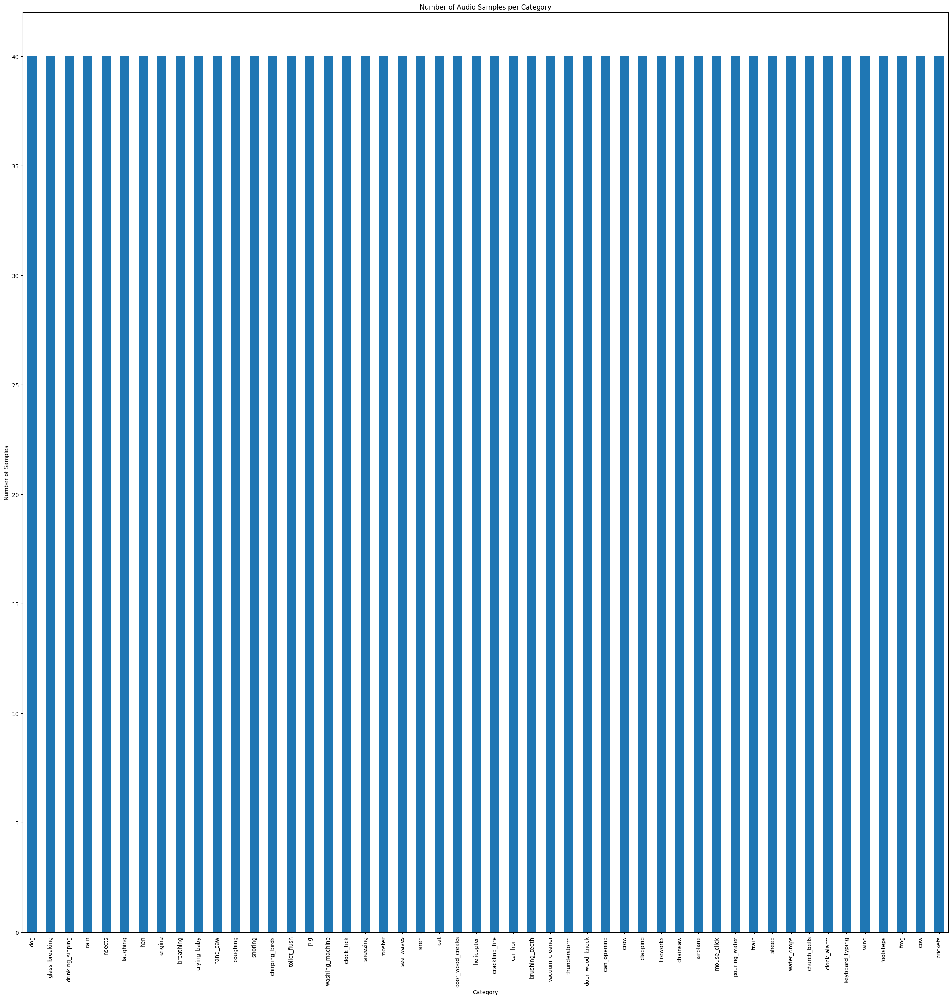

In [6]:

category_group = dataset['category'].value_counts()
plot = category_group.plot(kind='bar', title="Number of Audio Samples per Category", figsize=(30,30))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

In [7]:
# Lấy danh sách tất cả các file âm thanh
all_files = []
for path, subdirs, files in os.walk(DATA_PATH):
    for name in files:
        all_files.append(os.path.join(path, name))

In [8]:
plot_files = random.choices(all_files, k = 10)
plot_audios = [librosa.load(plot_files[i]) for i in range(10)]

In [9]:
# Dictionary để mã hóa và giải mã nhãn
decoder = {0: 'dog', 14: 'chirping_birds', 36: 'vacuum_cleaner', 19: 'thunderstorm', 30: 'door_wood_knock',
           34: 'can_opening', 9: 'crow', 22: 'clapping', 48: 'fireworks', 41: 'chainsaw', 47: 'airplane',
           31: 'mouse_click', 17: 'pouring_water', 45: 'train', 8: 'sheep', 15: 'water_drops', 46: 'church_bells',
           37: 'clock_alarm', 32: 'keyboard_typing', 16: 'wind', 25: 'footsteps', 4: 'frog', 3: 'cow',
           27: 'brushing_teeth', 43: 'car_horn', 12: 'crackling_fire', 40: 'helicopter', 29: 'drinking_sipping',
           10: 'rain', 7: 'insects', 26: 'laughing', 6: 'hen', 44: 'engine', 23: 'breathing', 20: 'crying_baby',
           49: 'hand_saw', 24: 'coughing', 39: 'glass_breaking', 28: 'snoring', 18: 'toilet_flush', 2: 'pig',
           35: 'washing_machine', 38: 'clock_tick', 21: 'sneezing', 1: 'rooster', 11: 'sea_waves', 42: 'siren',
           5: 'cat', 33: 'door_wood_creaks', 13: 'crickets'}

encoder = {v: k for k, v in decoder.items()}  # Tạo encoder từ decoder

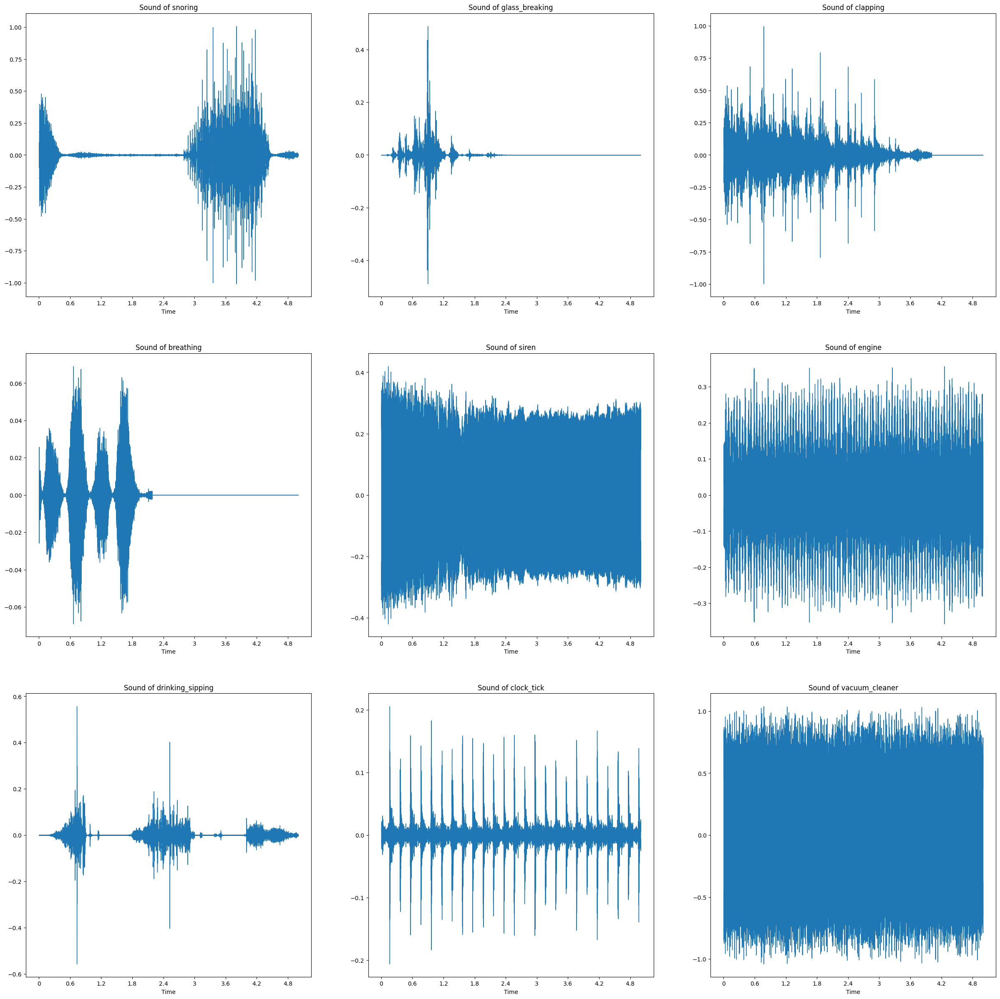

In [10]:


plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0])
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

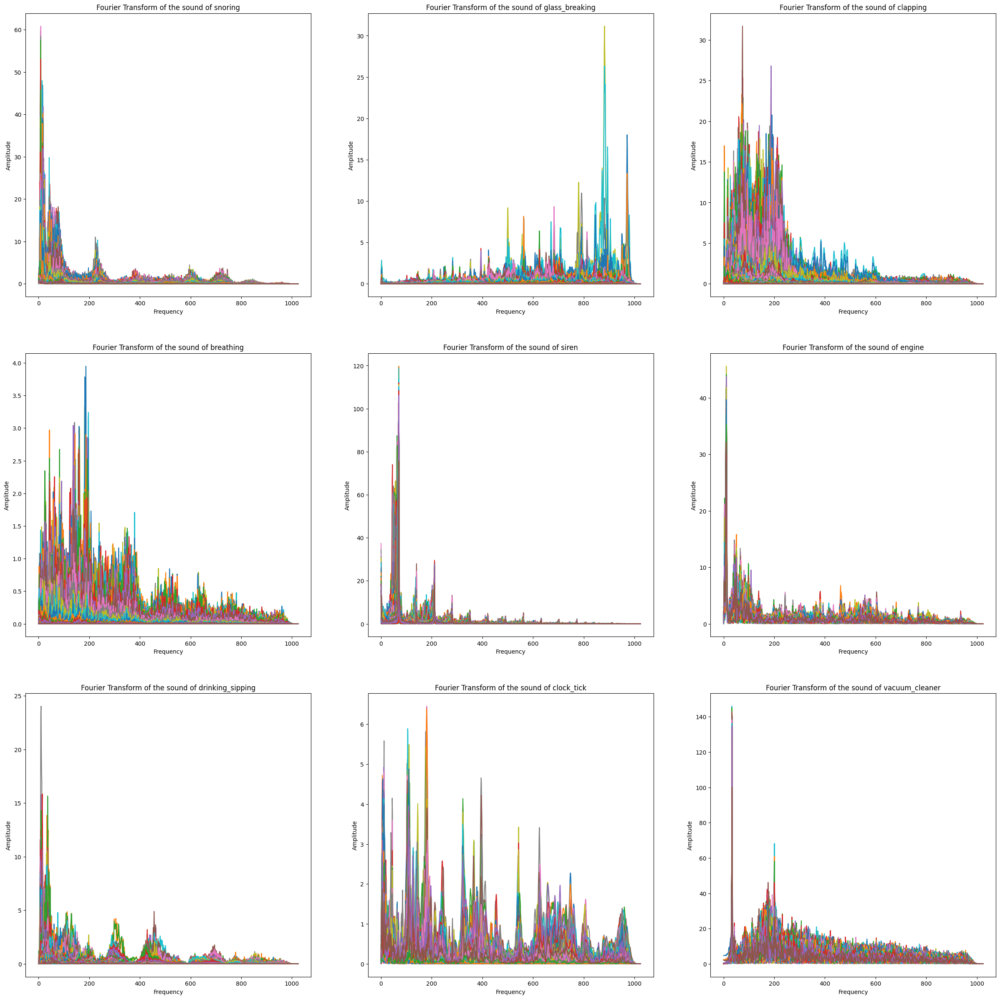

In [11]:


# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns 

plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    X = np.abs(librosa.stft(plot_audios[i][0], n_fft = n_fft, hop_length = hop_length))
    plt.plot(X)
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude");
    try:
        plt.title("Fourier Transform of the sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Fourier Transform of the sound of " + decoder[int(plot_files[i][-5:-4])] )

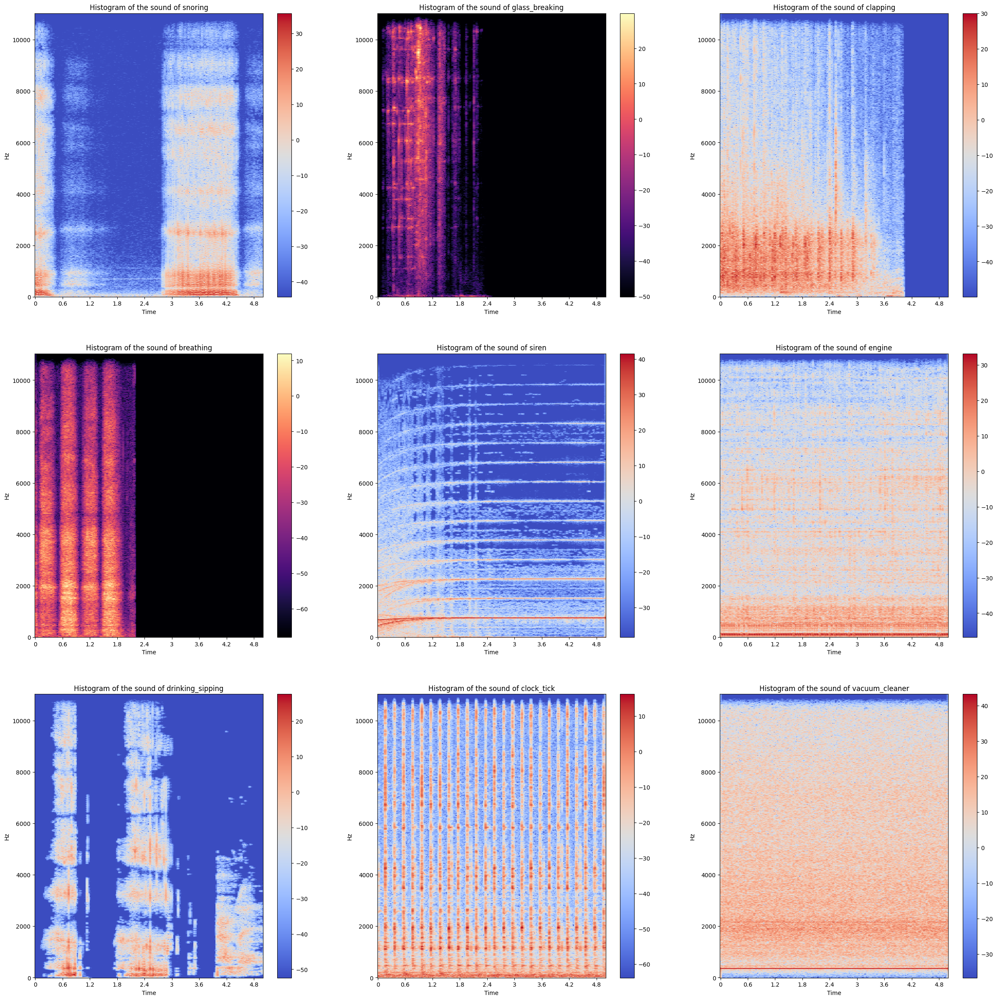

In [12]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    X = librosa.stft(plot_audios[i][0])
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=plot_audios[i][1], x_axis='time', y_axis='hz')
    plt.colorbar()
    try:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-5:-4])] )


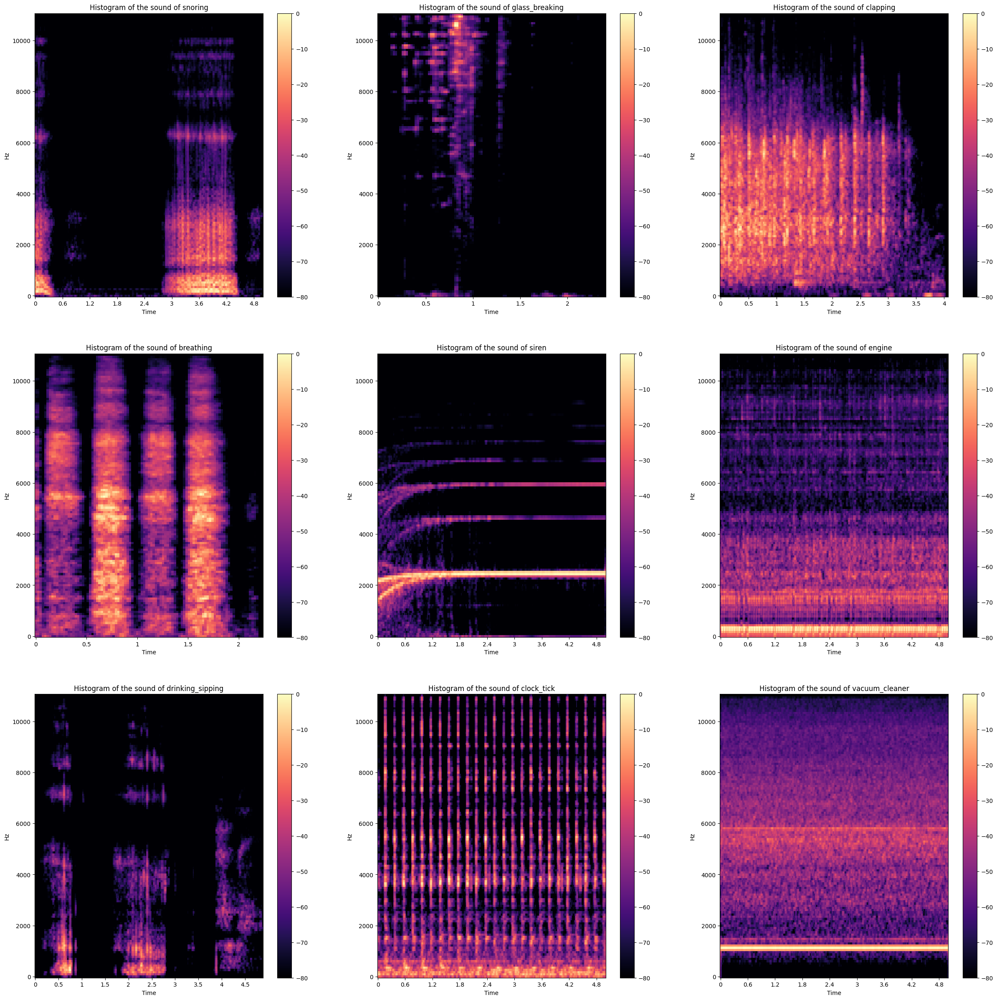

In [13]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    X, _ = librosa.effects.trim(plot_audios[i][0])
    XS = librosa.feature.melspectrogram(y=X, sr=plot_audios[i][1])
    Xdb = librosa.amplitude_to_db(XS, ref=np.max)
    librosa.display.specshow(Xdb, sr=plot_audios[i][1], x_axis='time', y_axis='hz')
    plt.colorbar()
    try:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-5:-4])] )

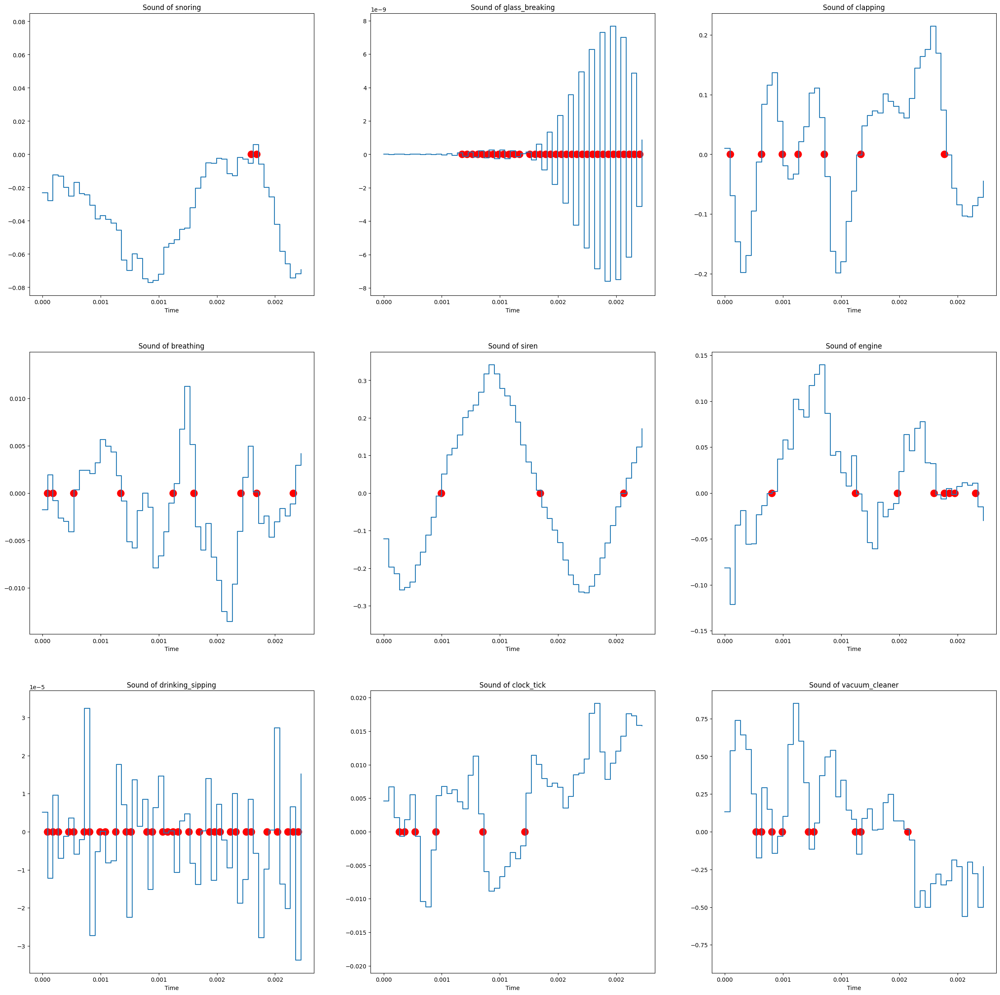

In [14]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    zoom = 50
    y = plot_audios[i][0][0:zoom]
    librosa.display.waveshow(y)
    crossings = librosa.zero_crossings(y, pad=False)
    t = np.linspace(0, 0.0022, num=zoom)
    plt.scatter(t[crossings],y[crossings]*0, color='r',linewidth=7.0)
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

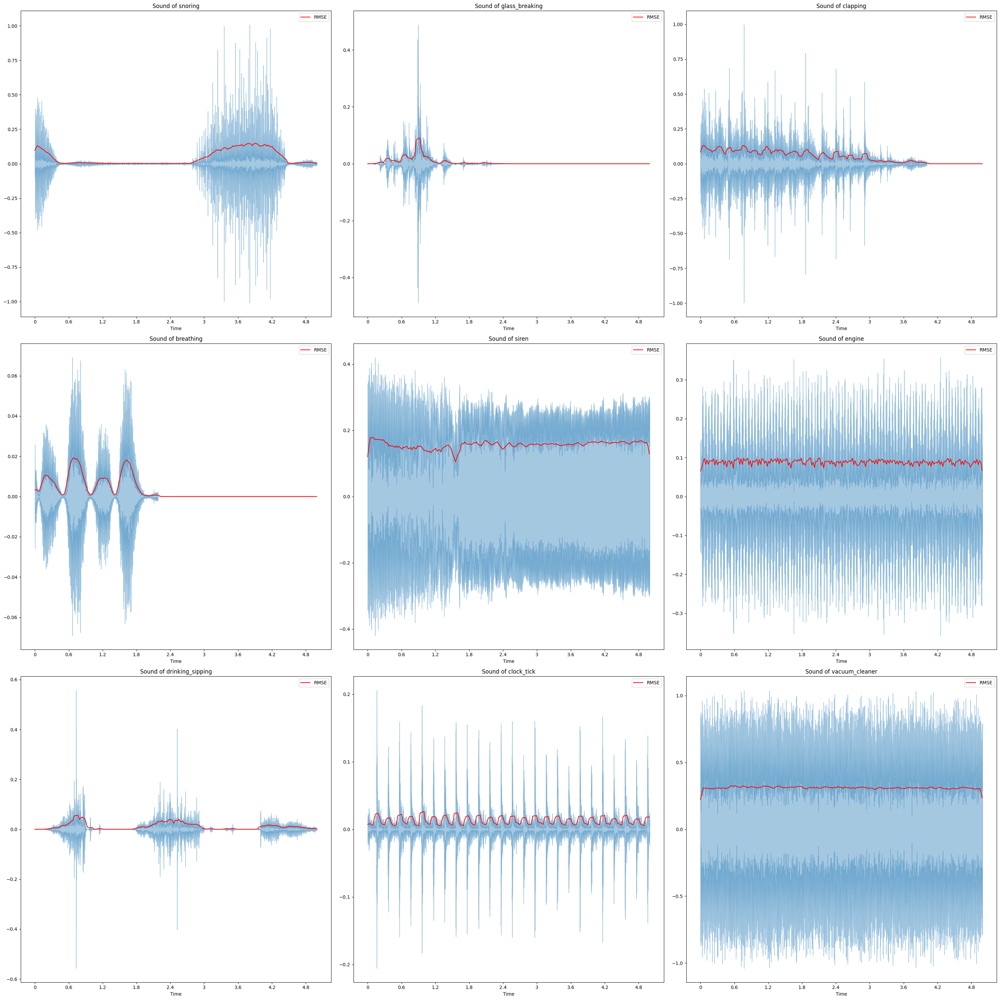

In [40]:
plt.figure(figsize=(30, 30))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    y = plot_audios[i][0]
    sr = plot_audios[i][1]
    
    # Tính toán RMSE
    rmse = librosa.feature.rms(y=y)[0]
    
    # Trục thời gian
    frames = range(len(rmse))
    t = librosa.frames_to_time(frames, sr=sr)
    
    # Hiển thị sóng âm gốc
    librosa.display.waveshow(y, sr=sr, alpha=0.4)
    
    # Vẽ RMSE trên đồ thị
    plt.plot(t, rmse, color='r', label="RMSE")
    
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])])
    
    plt.legend()

plt.tight_layout()
plt.show()


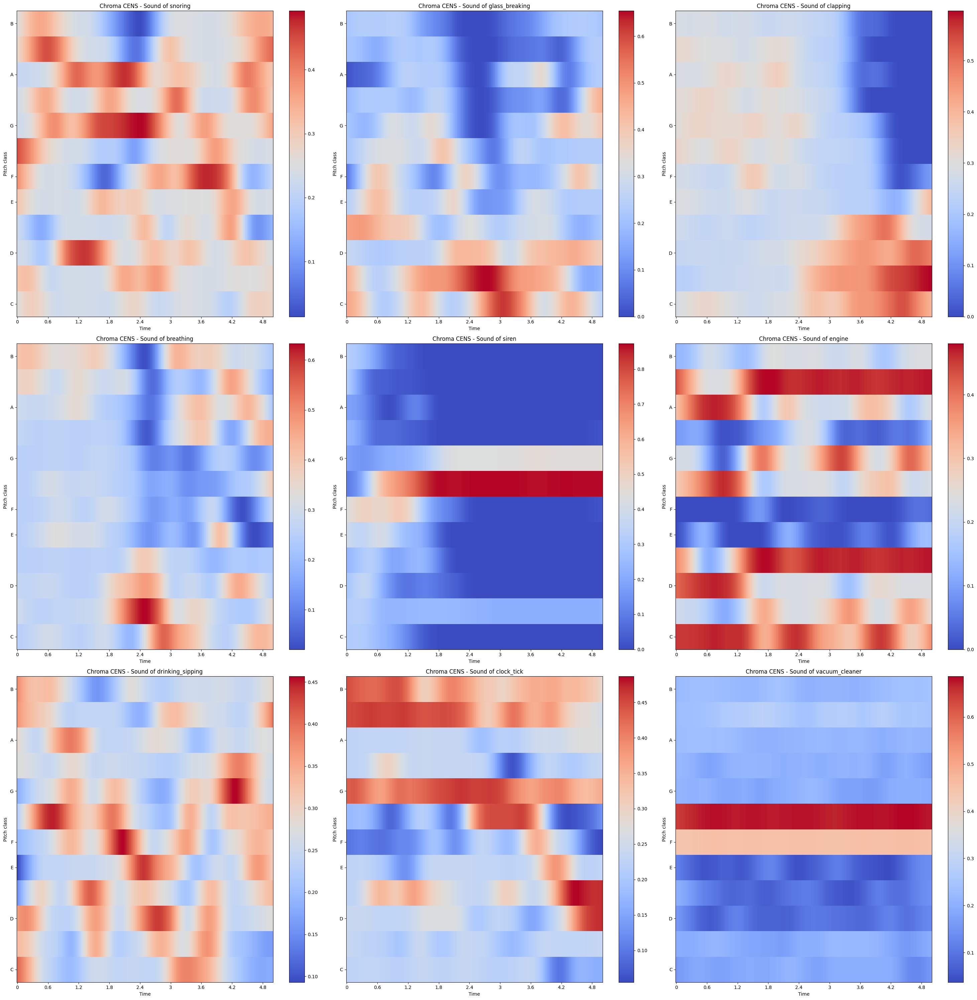

In [42]:
plt.figure(figsize=(30, 30))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    y = plot_audios[i][0]
    sr = plot_audios[i][1]

    # Tính toán chroma_cens
    chroma_cens = librosa.feature.chroma_cens(y=y, sr=sr)

    # Hiển thị chroma_cens bằng specshow
    librosa.display.specshow(chroma_cens, sr=sr, x_axis='time', y_axis='chroma', cmap='coolwarm')

    try:
        plt.title("Chroma CENS - Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Chroma CENS - Sound of " + decoder[int(plot_files[i][-5:-4])])

    plt.colorbar()

plt.tight_layout()
plt.show()


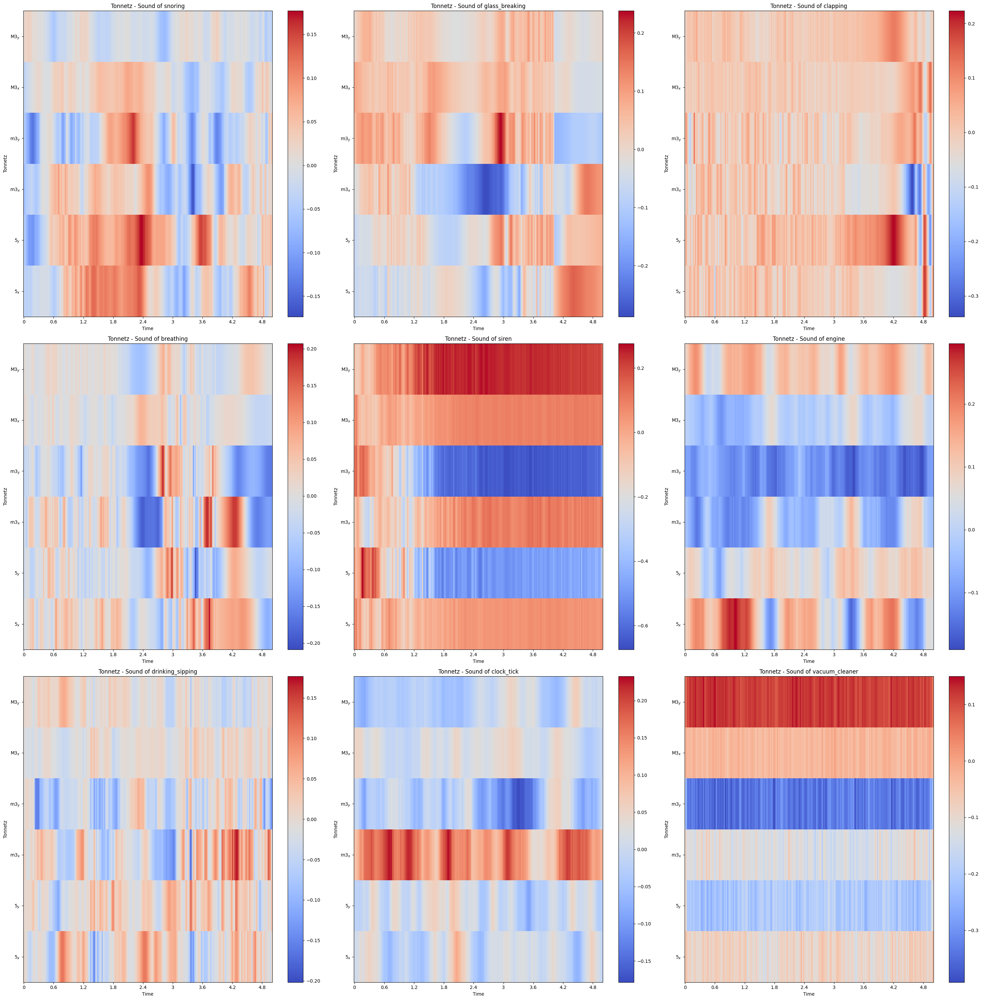

In [43]:
plt.figure(figsize=(30, 30))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    y = plot_audios[i][0]
    sr = plot_audios[i][1]

    # Tính toán tonnetz
    tonnetz = librosa.feature.tonnetz(y=librosa.effects.harmonic(y), sr=sr)

    # Hiển thị tonnetz bằng specshow
    librosa.display.specshow(tonnetz, sr=sr, x_axis='time', y_axis='tonnetz', cmap='coolwarm')

    try:
        plt.title("Tonnetz - Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Tonnetz - Sound of " + decoder[int(plot_files[i][-5:-4])])

    plt.colorbar()

plt.tight_layout()
plt.show()


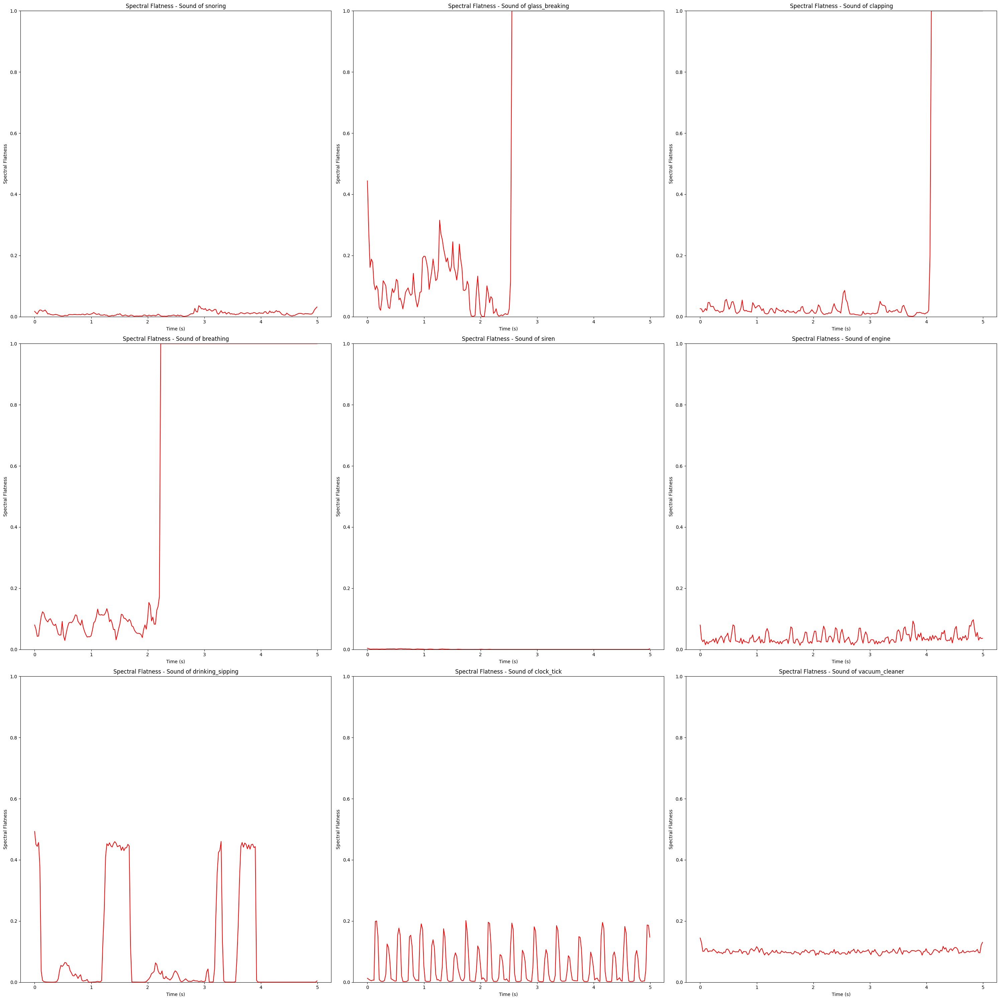

In [44]:
plt.figure(figsize=(30, 30))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    y = plot_audios[i][0]
    sr = plot_audios[i][1]

    # Tính toán Spectral Flatness
    spectral_flatness = librosa.feature.spectral_flatness(y=y)

    # Trục thời gian
    frames = range(len(spectral_flatness[0]))
    t = librosa.frames_to_time(frames, sr=sr)

    # Vẽ biểu đồ Spectral Flatness
    plt.plot(t, spectral_flatness[0], color='r')
    plt.xlabel("Time (s)")
    plt.ylabel("Spectral Flatness")
    plt.ylim(0, 1)  # Giá trị Spectral Flatness nằm trong khoảng 0-1

    try:
        plt.title("Spectral Flatness - Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Spectral Flatness - Sound of " + decoder[int(plot_files[i][-5:-4])])

plt.tight_layout()
plt.show()


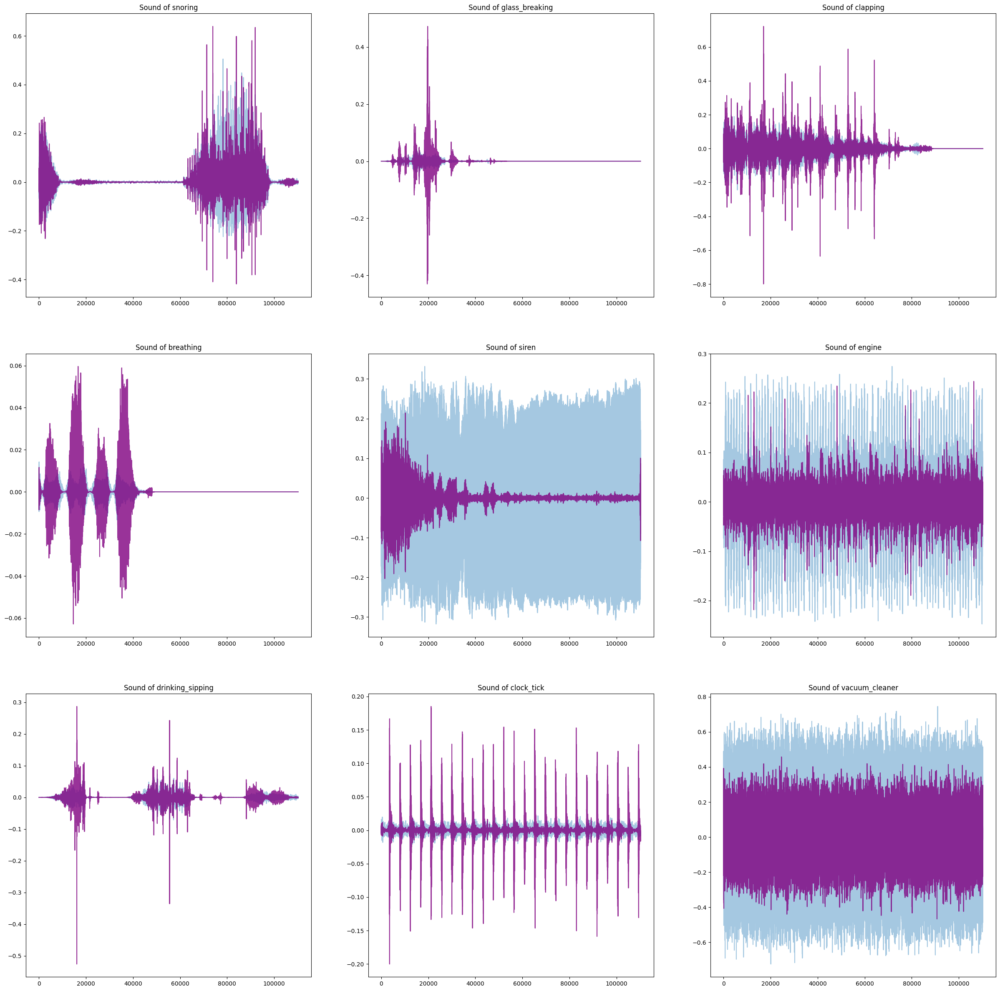

In [15]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    y_harm, y_perc = librosa.effects.hpss(plot_audios[i][0])
    plt.plot(y_harm, alpha=0.4);
    plt.plot(y_perc, color = 'purple', alpha=0.8);
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

In [16]:
for i in range(1,10):
    tempo, _ = librosa.beat.beat_track(y=plot_audios[i][0], sr=plot_audios[i][1])
    
    file_path = plot_files[i]  # Đường dẫn gốc
    try:
        sound_label = decoder[int(plot_files[i][-6:-4])]
    except:
        sound_label = decoder[int(plot_files[i][-5:-4])]

    print('File path : ', file_path)
    print('Sound of ' + sound_label)
    print('BPM :', tempo)
    print('--------------------------')


File path :  ESC-50-master/audio/4-197454-A-28.wav
Sound of snoring
BPM : [107.66601562]
--------------------------
File path :  ESC-50-master/audio/1-88807-A-39.wav
Sound of glass_breaking
BPM : [129.19921875]
--------------------------
File path :  ESC-50-master/audio/3-177083-A-22.wav
Sound of clapping
BPM : [151.99908088]
--------------------------
File path :  ESC-50-master/audio/3-112557-B-23.wav
Sound of breathing
BPM : [135.99917763]
--------------------------
File path :  ESC-50-master/audio/5-133989-A-42.wav
Sound of siren
BPM : [143.5546875]
--------------------------
File path :  ESC-50-master/audio/3-119455-A-44.wav
Sound of engine
BPM : [143.5546875]
--------------------------
File path :  ESC-50-master/audio/1-67230-A-29.wav
Sound of drinking_sipping
BPM : [89.10290948]
--------------------------
File path :  ESC-50-master/audio/3-171041-A-38.wav
Sound of clock_tick
BPM : [151.99908088]
--------------------------
File path :  ESC-50-master/audio/5-188365-A-36.wav
Sound o

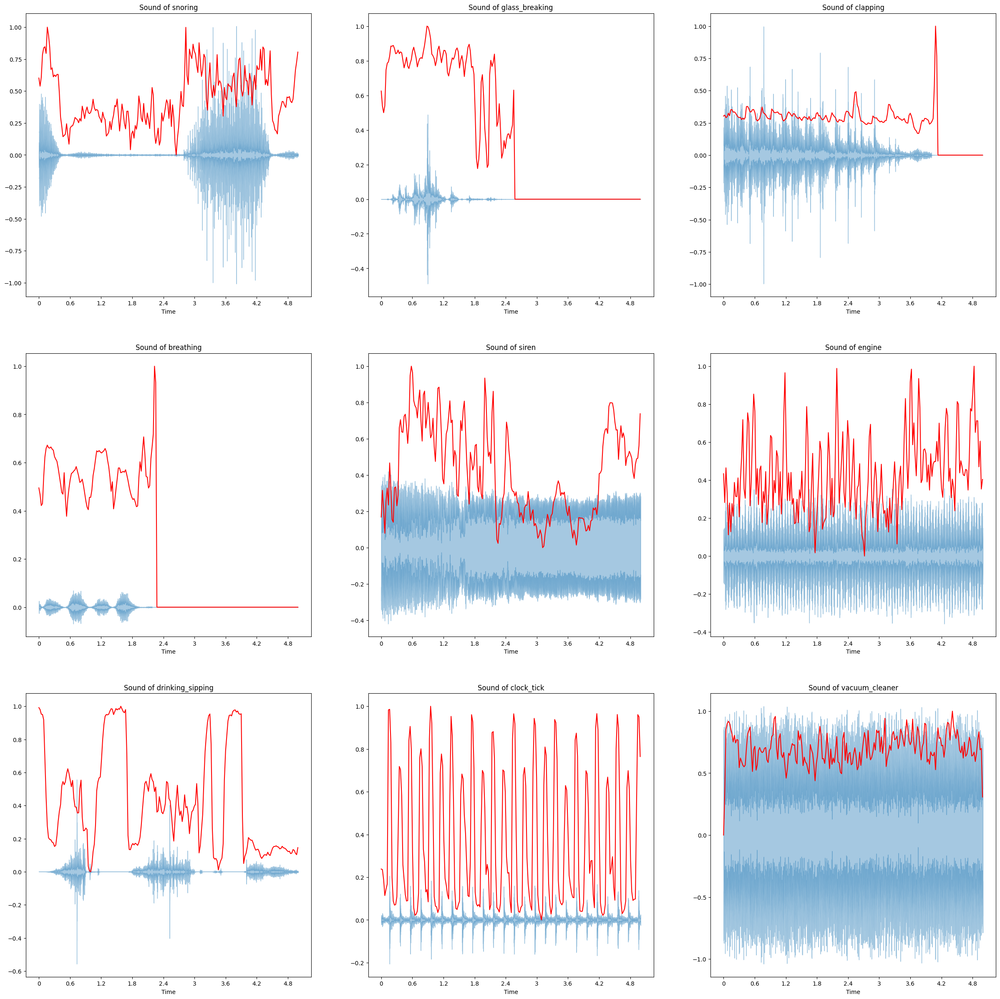

In [17]:

plt.figure(figsize=(30,30))
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0], alpha=0.4)
    spectral_centroids = librosa.feature.spectral_centroid(y=plot_audios[i][0], sr=plot_audios[i][1])[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    plt.plot(t, normalize(spectral_centroids), color='r')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

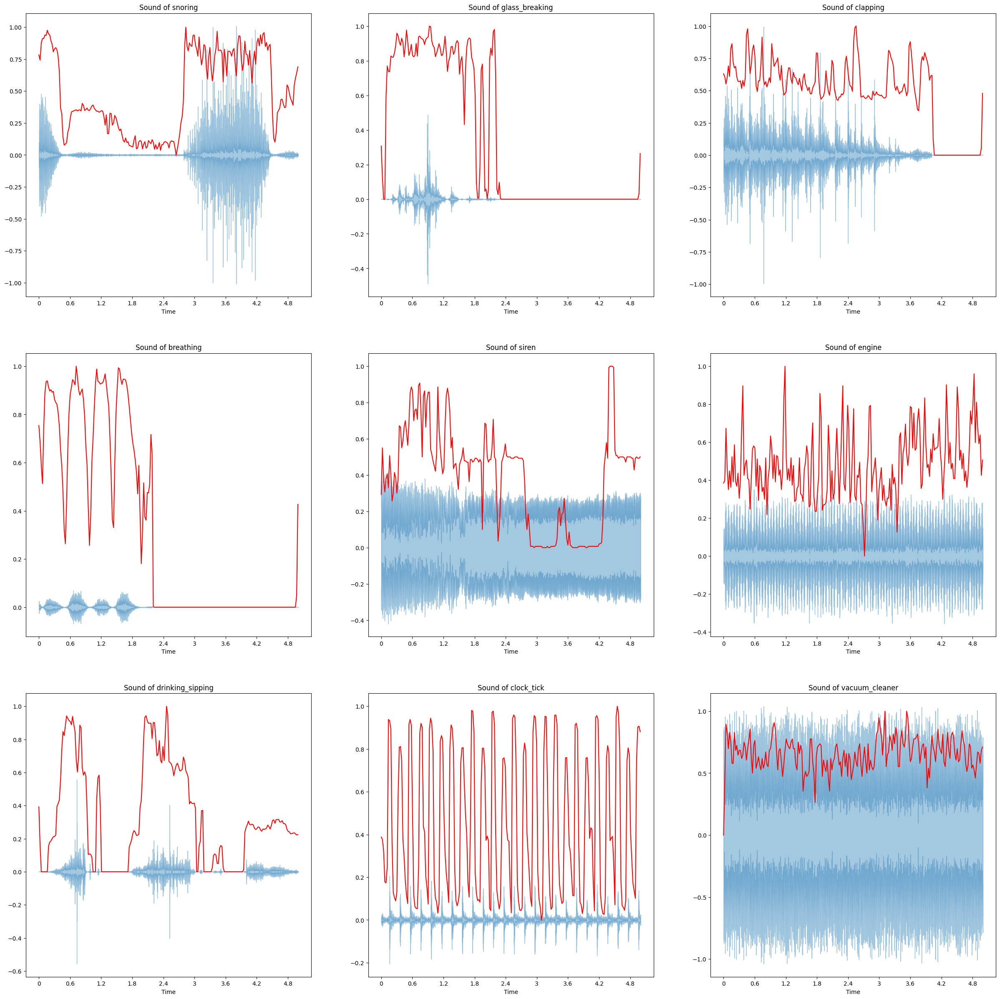

In [18]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0],alpha=0.4)
    spectral_rolloff = librosa.feature.spectral_rolloff(y=plot_audios[i][0]+0.01, sr=plot_audios[i][1])[0]
    frames = range(len(spectral_rolloff))
    t = librosa.frames_to_time(frames)
    plt.plot(t, normalize(spectral_rolloff), color='r')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )


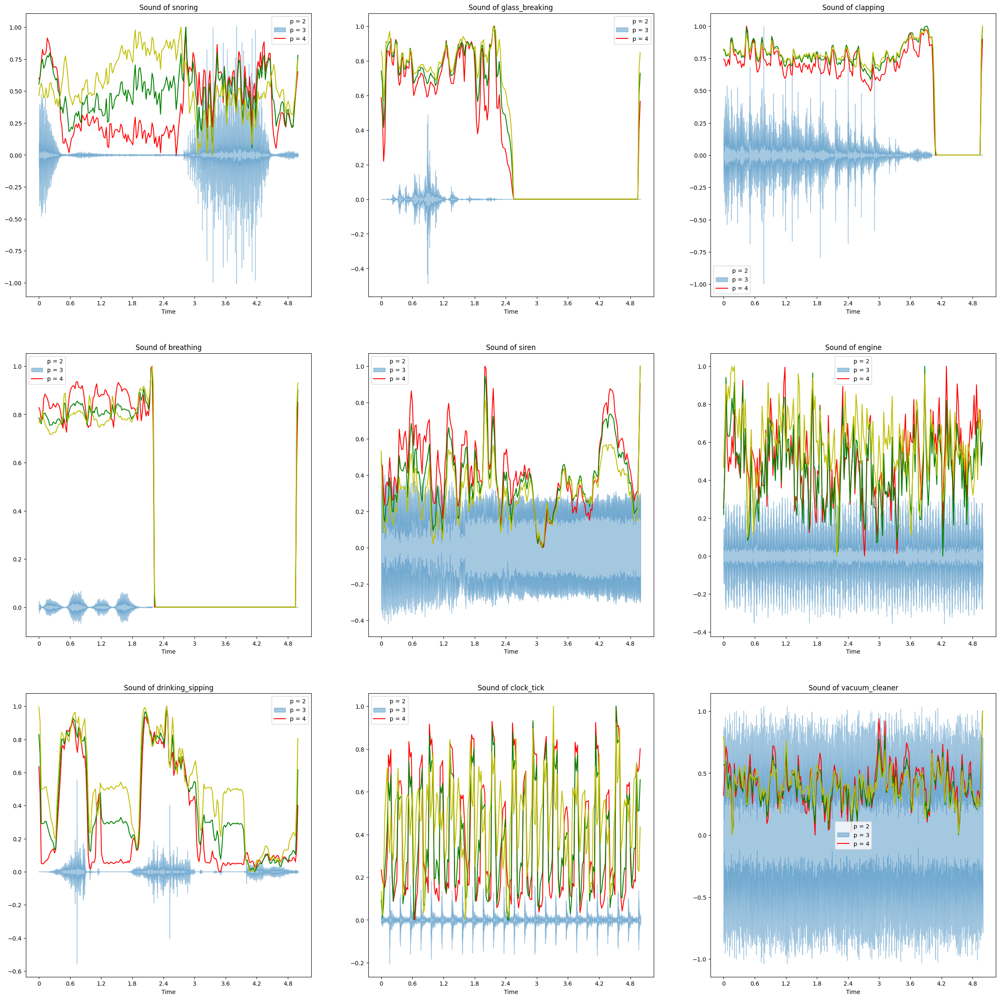

In [19]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0], alpha=0.4)
    spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y=plot_audios[i][0]+0.01, sr=plot_audios[i][1])[0]
    spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y=plot_audios[i][0]+0.01, sr=plot_audios[i][1], p=3)[0]
    spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y=plot_audios[i][0]+0.01, sr=plot_audios[i][1], p=4)[0]

    plt.plot(t, normalize(spectral_bandwidth_2), color='r')
    plt.plot(t, normalize(spectral_bandwidth_3), color='g')
    plt.plot(t, normalize(spectral_bandwidth_4), color='y')
    plt.legend(('p = 2', 'p = 3', 'p = 4'))
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

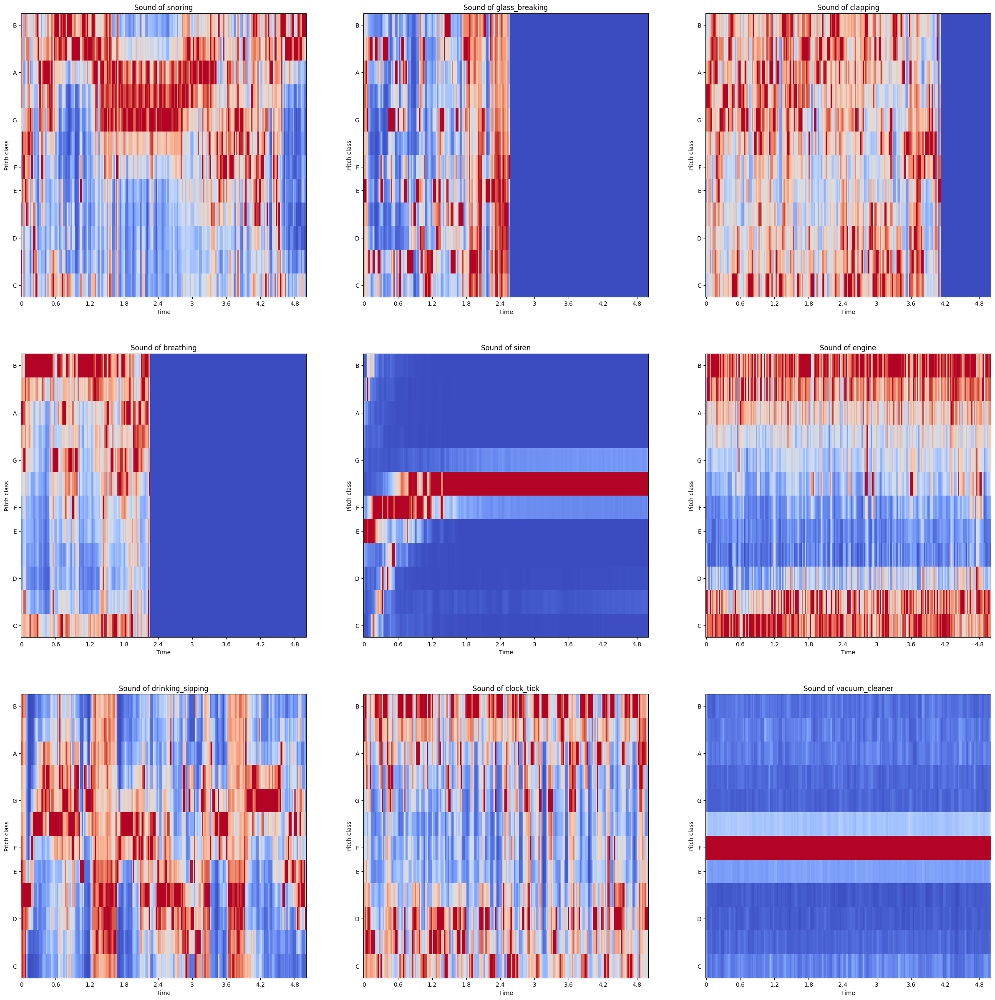

In [20]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    chromagram = librosa.feature.chroma_stft(y=plot_audios[i][0], sr=plot_audios[i][1], hop_length=hop_length)
    librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

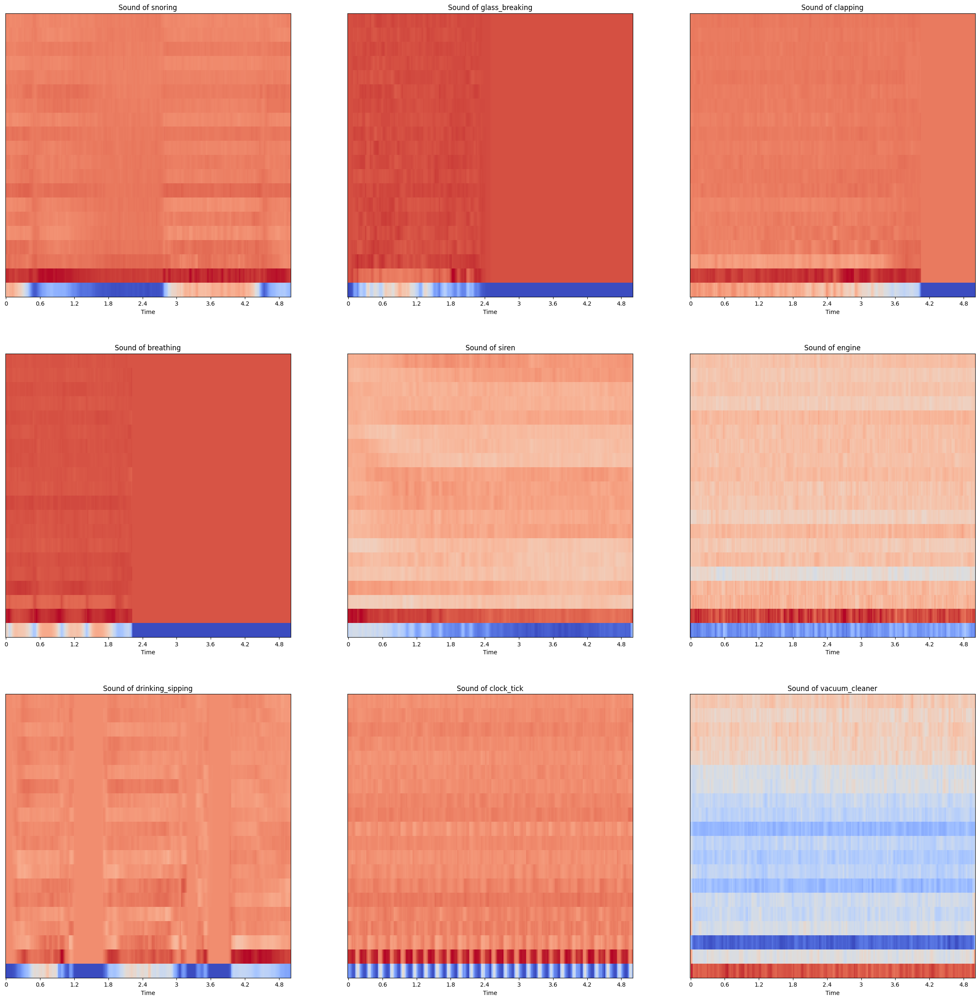

In [21]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    mfccs = librosa.feature.mfcc(y=plot_audios[i][0], sr=plot_audios[i][1])
    librosa.display.specshow(mfccs, sr=plot_audios[i][1], x_axis='time')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

In [22]:

# ✅ Mã hóa nhãn
encoder = LabelEncoder()
dataset["target"] = encoder.fit_transform(dataset["category"])
num_classes = len(encoder.classes_)

# ✅ Trích xuất đặc trưng âm thanh
features = ['zero_crossing_rate', 'chroma_stft', 'rmse', 'spectral_centroid', 'spectral_bandwidth',
            'beat_per_minute', 'rolloff'] + [f'mfcc_{i}' for i in range(20)]

for feature in features:
    dataset[feature] = np.zeros(len(dataset))

for i in tqdm(range(len(dataset))):
    file_path = dataset['files_path'][i]
    if os.path.exists(file_path):
        y, sr = librosa.load(file_path, mono=True)
        dataset.at[i, 'rmse'] = np.mean(librosa.feature.rms(y=y))
        dataset.at[i, 'chroma_stft'] = np.mean(librosa.feature.chroma_stft(y=y, sr=sr))
        dataset.at[i, 'spectral_centroid'] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
        dataset.at[i, 'spectral_bandwidth'] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
        dataset.at[i, 'rolloff'] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
        dataset.at[i, 'zero_crossing_rate'] = np.mean(librosa.feature.zero_crossing_rate(y))
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
        dataset.at[i, 'beat_per_minute'] = tempo
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        for e in range(20):
            dataset.at[i, f'mfcc_{e}'] = np.mean(mfcc[e])

  5%|██▏                                     | 108/2000 [00:08<02:29, 12.67it/s]/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
100%|███████████████████████████████████████| 2000/2000 [02:34<00:00, 12.94it/s]


In [23]:
# ✅ Chia tập dữ liệu train/test
train = dataset.sample(frac=0.8, random_state=SEED)
test = dataset.drop(train.index)

X_train = train[features]
X_test = test[features]
y_train = train['target']
y_test = test['target']
# su dung min max scale
scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1741648350.463449    3778 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 5895 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3070 Ti, pci bus id: 0000:82:00.0, compute capability: 8.6



🔵 Training CNN...
Epoch 1/100


I0000 00:00:1741648353.803211    5661 service.cc:148] XLA service 0x3d323920 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741648353.803364    5661 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti, Compute Capability 8.6
2025-03-11 06:12:33.896124: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1741648354.185210    5661 cuda_dnn.cc:529] Loaded cuDNN version 90400


45/50 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.0449 - loss: 3.8971

I0000 00:00:1741648357.705360    5661 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


50/50 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - accuracy: 0.0470 - loss: 3.8851 - val_accuracy: 0.0600 - val_loss: 3.8851
Epoch 2/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1470 - loss: 3.3951 - val_accuracy: 0.0975 - val_loss: 3.8056
Epoch 3/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2204 - loss: 3.0069 - val_accuracy: 0.1300 - val_loss: 3.6973
Epoch 4/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2685 - loss: 2.7228 - val_accuracy: 0.2800 - val_loss: 3.5378
Epoch 5/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3060 - loss: 2.5632 - val_accuracy: 0.2500 - val_loss: 3.4728
Epoch 6/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.3451 - loss: 2.3520 - val_accuracy: 0.3050 - val_loss: 3.2650
Epoch 7/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3632 - loss: 2.3483 - val_accuracy: 0.3325 - val_loss: 3.0714
Epoch 8/100
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3962 - loss: 2.2090 - val_accuracy: 0.3425 - val_loss: 2

/tmp/ipykernel_3778/1936390492.py:82: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")


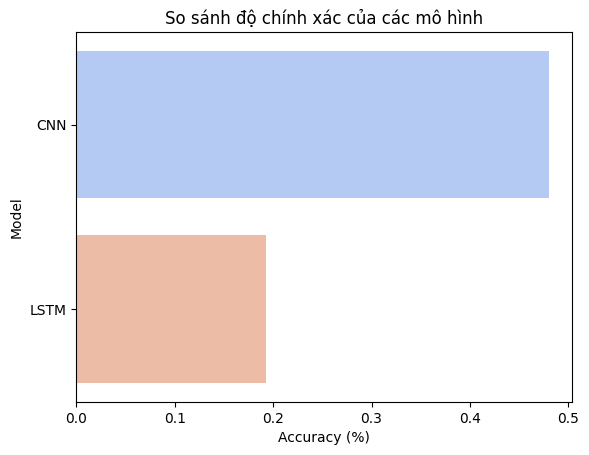


🔹 Bảng Xếp Hạng Top Models:
Model  Train Accuracy  Train Loss  Test Accuracy  Test Loss
  CNN         0.87625    0.395458         0.4800   3.618419
 LSTM         0.25250    2.693823         0.1925   3.078909


/tmp/ipykernel_3778/1936390492.py:97: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")


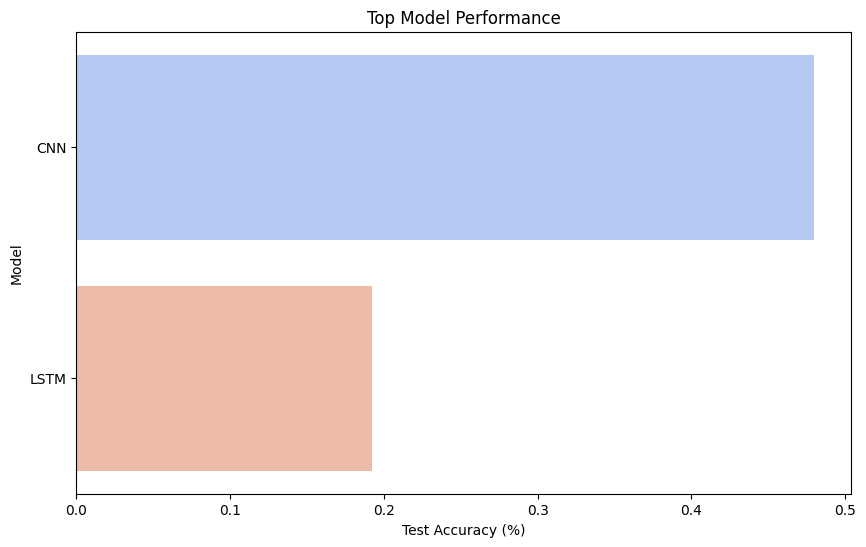

In [24]:
# 2 mô hình CNN, LSTM basic (first trrain)
# ✅ Xây dựng 2 mô hình CNN, LSTM
def build_cnn(input_shape, num_classes):
    model = models.Sequential([
        layers.Dense(512, activation="relu", input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(128, activation="relu"),
        layers.Dense(64, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation="softmax")
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model

def attention_layer(inputs):
    """
    Cơ chế Attention giúp mô hình tập trung vào đặc trưng quan trọng.
    """
    attention_weights = layers.Dense(1, activation="tanh")(inputs)
    attention_weights = layers.Flatten()(attention_weights)
    attention_weights = layers.Activation("softmax")(attention_weights)
    attention_weights = layers.RepeatVector(inputs.shape[-1])(attention_weights)
    attention_weights = layers.Permute([2, 1])(attention_weights)
    
    return layers.Multiply()([inputs, attention_weights])

def build_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    
    # ✅ Thêm CNN để trích xuất đặc trưng trước khi đưa vào LSTM
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Conv1D(128, kernel_size=3, padding="same", activation="relu")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    
    # ✅ Bi-directional LSTM để tận dụng ngữ cảnh hai chiều
    x = layers.Bidirectional(layers.LSTM(128, return_sequences=True))(x)
    x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)

    # ✅ Thêm Attention
    x = attention_layer(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),  # Giảm learning rate
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model


# ✅ Huấn luyện 3 mô hình
models_dict = {
    "CNN": build_cnn((X_train.shape[1],), num_classes),
    "LSTM": build_lstm((X_train.shape[1],), num_classes)
}

results = []
for name, model in models_dict.items():
    print(f"\n🔵 Training {name}...")
    history =model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)
    train_acc = history.history['accuracy'][-1]  # Get the last epoch's training accuracy
    train_loss = history.history['loss'][-1]      # Get the last epoch's training loss
    test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
    results.append({
            "Model": name,
            "Train Accuracy": train_acc,
            "Train Loss": train_loss,
            "Test Accuracy": test_acc,
            "Test Loss": test_loss
        })

# ✅ Bảng tổng hợp kết quả
df_results = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)
df_results_styled = df_results.style.background_gradient(cmap="coolwarm")
print(df_results_styled)
sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")
plt.xlabel("Accuracy (%)")
plt.ylabel("Model")
plt.title("So sánh độ chính xác của các mô hình")
plt.show()

# ✅ Sắp xếp top model theo độ chính xác
df_summary = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)


# ✅ Hiển thị bảng xếp hạng top model
print("\n🔹 Bảng Xếp Hạng Top Models:")
print(df_summary.to_string(index=False))
# ✅ Vẽ biểu đồ Top Models
plt.figure(figsize=(10, 6))
sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")
plt.xlabel("Test Accuracy (%)")
plt.ylabel("Model")
plt.title("Top Model Performance")
plt.show()


🟢 Đang dự đoán với mô hình: CNN
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

🟢 Đang dự đoán với mô hình: LSTM
13/13 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step

🔹 Bảng Tổng Hợp Accuracy:
Model  Correct Predictions  Incorrect Predictions  Accuracy (%)
  CNN                  192                    208         48.00
 LSTM                   77                    323         19.25

🔹 Bảng Chi Tiết Dự Đoán - CNN:
                                File       True Label Predicted Label Correct
ESC-50-master/audio/1-43807-A-47.wav  washing_machine washing_machine       ✅
ESC-50-master/audio/1-56270-A-29.wav      water_drops      clock_tick       ❌
ESC-50-master/audio/1-13571-A-46.wav          rooster         rooster       ✅
ESC-50-master/audio/1-43807-B-47.wav         clapping      clock_tick       ❌
ESC-50-master/audio/1-19898-B-41.wav  door_wood_knock      clock_tick       ❌
ESC-50-master/audio/1-19111-A-24.wav              cat             cat       ✅
ESC-50-master/audio/1-70300-A-45.wav       helicopter   

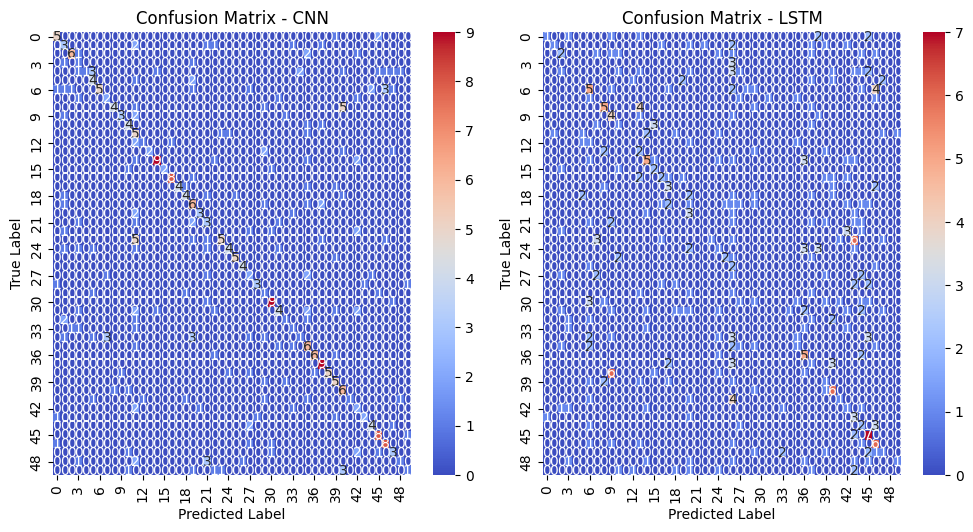

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 

🔹 Classification Report - CNN:
                  precision    recall  f1-score   support

        airplane       0.56      0.62      0.59         8
       breathing       0.23      0.33      0.27         9
  brushing_teeth       0.75      0.60      0.67        10
     can_opening       0.11      0.33      0.17         3
        car_horn       1.00      0.08      0.14        13
             cat       0.36      0.57      0.44         7
        chainsaw       1.00      0.31      0.48        16
  chirping_birds       0.33      0.40      0.36         5
    church_bells       0.80      0.36      0.50        11
        clapping       0.75      0.43      0.55         7
     clock_alarm       0.50      0.67      0.57         6
      clock_tick       0.16      0.62      0.25         8
        coughing       0.50      0.25      0.33         4
             cow       1.00      0.33      0.50         6
  crackling_fire       0.82      0.64      0.72        14

/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(r

In [25]:
# ✅ Lấy 1000 mẫu ngẫu nhiên từ tập test gốc
random_indices = np.random.choice(len(X_test), 400, replace=False)

# ✅ Dự đoán nhãn cho từng mô hình
model_results = []
summary_stats = []

for name, model in models_dict.items():
    print(f"\n🟢 Đang dự đoán với mô hình: {name}")
    y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
    y_true = y_test.iloc[random_indices].values

    # ✅ Chuyển nhãn về dạng tên thực tế
    true_labels = encoder.inverse_transform(y_true)
    predicted_labels = encoder.inverse_transform(y_pred)

    # ✅ Tổng hợp kết quả dự đoán
    results = []
    for i in range(len(random_indices)):
        results.append({
            "Model": name,
            "File": dataset.iloc[random_indices[i]]["files_path"],
            "True Label": true_labels[i],
            "Predicted Label": predicted_labels[i],
            "Correct": "✅" if true_labels[i] == predicted_labels[i] else "❌"
        })

    df_results = pd.DataFrame(results)

    # ✅ Tính toán số dự đoán đúng/sai
    correct_predictions = sum(y_true == y_pred)
    incorrect_predictions = len(y_true) - correct_predictions
    accuracy = round((correct_predictions / len(y_true)) * 100, 2)

    # ✅ Xuất bảng tổng hợp
    summary_stats.append({
        "Model": name,
        "Correct Predictions": correct_predictions,
        "Incorrect Predictions": incorrect_predictions,
        "Accuracy (%)": accuracy
    })

    # ✅ Lưu kết quả dự đoán của từng mô hình
    model_results.append(df_results)

# ✅ Hiển thị bảng tổng hợp kết quả Accuracy
df_summary = pd.DataFrame(summary_stats)

print("\n🔹 Bảng Tổng Hợp Accuracy:")
print(df_summary.to_string(index=False))

# ✅ Hiển thị bảng chi tiết kết quả dự đoán của từng mô hình
for df in model_results:
    model_name = df["Model"][0]
    print(f"\n🔹 Bảng Chi Tiết Dự Đoán - {model_name}:")
    print(df[['File', 'True Label', 'Predicted Label', 'Correct']].head(10).to_string(index=False))  # Hiển thị 10 dòng đầu tiên

# ✅ Hiển thị ma trận nhầm lẫn cho từng mô hình
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dict.items()):
    y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
    y_true = y_test.iloc[random_indices].values

    plt.subplot(2, 3, i + 1)  # Điều chỉnh để phù hợp với số mô hình
    sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt="d", cmap="coolwarm")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix - {name}")

plt.tight_layout()
plt.show()

# ✅ Xuất báo cáo phân loại cho từng mô hình
for name, model in models_dict.items():
    y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
    y_true = y_test.iloc[random_indices].values

    print(f"\n🔹 Classification Report - {name}:")
    print(classification_report(y_true, y_pred, labels=np.unique(y_true), target_names=encoder.inverse_transform(np.unique(y_true))))

# **============================ STARRT HERE ==================================**

In [26]:
# ✅ Tạo thư mục tăng cường
os.makedirs(AUGMENTED_PATH, exist_ok=True)

In [27]:
# ✅ Hàm lưu âm thanh tăng cường
def save_augmented_audio(filename, data, sr=16000):
   sf.write(filename, data, sr)
# ✅ Các phương pháp tăng cường dữ liệu
def add_noise(data):
    noise = np.random.normal(0, 0.02, len(data))
    return data + noise

def pitch_shifting(data, sr=16000):
    bins_per_octave = 12
    pitch_pm = 2
    pitch_change = pitch_pm * 2 * (np.random.uniform())
    return librosa.effects.pitch_shift(data.astype(np.float32), sr=sr, n_steps=pitch_change, bins_per_octave=bins_per_octave)

def random_shift(data):
    shift = int(np.random.uniform(-0.2, 0.2) * len(data))
    return np.roll(data, shift)

def volume_scaling(data):
    return data * np.random.uniform(0.7, 1.3)

def time_stretching(data, rate=1.5):
    return librosa.effects.time_stretch(data.astype(np.float32), rate=rate)

def volume_change(data, gain=3):
   return data * (10**(gain / 20))

def add_time_delay(data, delay_samples=1000):
    """
    Thêm độ trễ vào âm thanh.
    :param data: Dữ liệu âm thanh gốc.
    :param delay_samples: Số mẫu bị trễ.
    :return: Dữ liệu âm thanh sau khi thêm độ trễ.
    """
    delayed_signal = np.zeros_like(data)
    delayed_signal[delay_samples:] = data[:-delay_samples]
    return data + 0.5 * delayed_signal  # Trộn tín hiệu gốc và tín hiệu bị trễ  

In [28]:
# ✅ Thực hiện tăng cường dữ liệu
print("\n🟢 Bắt đầu thực hiện Data Augmentation...")
augmented_files = []
augmented_targets = []
for index, row in tqdm(dataset.iterrows(), total=len(dataset)):
   file_path = row["files_path"]
   label = row["target"]
   try:
       data, sr = librosa.load(file_path, sr=16000)
       augmentations = [add_noise(data), pitch_shifting(data, sr=sr), random_shift(data),volume_scaling(data), time_stretching(data, rate=1.5), volume_change(data,gain=3),add_time_delay(data, delay_samples=1000)]
       for idx, aug_data in enumerate(augmentations):
           aug_filename = f"{row['filename'][:-4]}_aug_{idx}.wav"
           aug_filepath = os.path.join(AUGMENTED_PATH, aug_filename)
           save_augmented_audio(aug_filepath, aug_data, sr)
           augmented_files.append(aug_filepath)
           augmented_targets.append(label)
   except Exception as e:
       print(f"⚠️ Lỗi khi tăng cường dữ liệu cho file {file_path}: {e}")




🟢 Bắt đầu thực hiện Data Augmentation...


100%|███████████████████████████████████████| 2000/2000 [02:44<00:00, 12.15it/s]


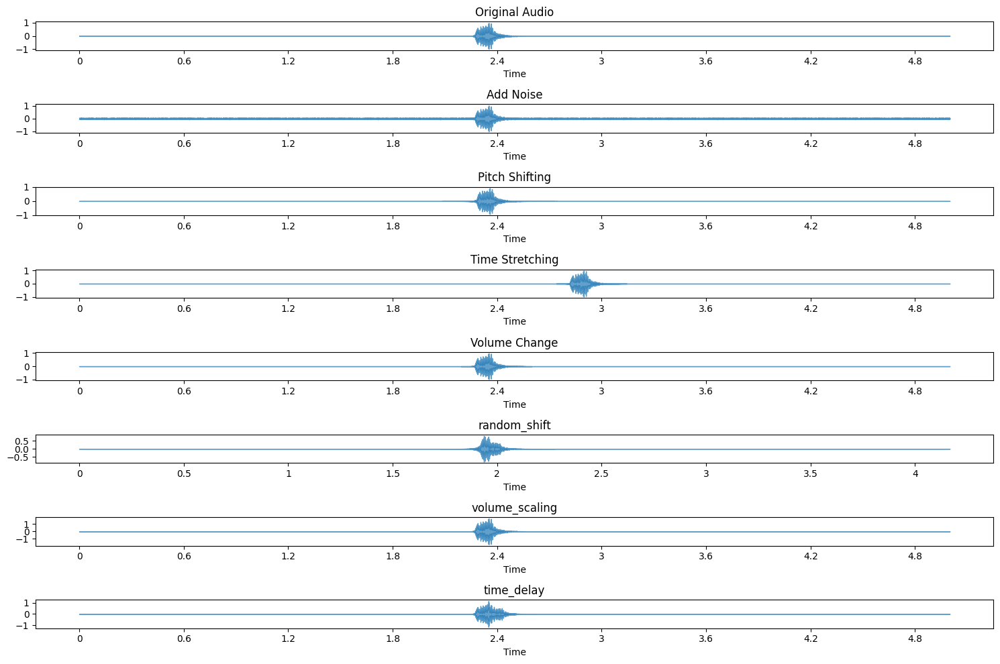

In [29]:
# ✅ Hàm hiển thị sóng âm
def plot_waveforms(original, augmented_list, sr=16000, labels=None):
    plt.figure(figsize=(15, 10))
    
    num_plots = len(augmented_list) + 1
    plt.subplot(num_plots, 1, 1)
    librosa.display.waveshow(original, sr=sr, alpha=0.7)
    plt.title("Original Audio")
    
    for i, (aug, label) in enumerate(zip(augmented_list, labels), start=2):
        plt.subplot(num_plots, 1, i)
        librosa.display.waveshow(aug, sr=sr, alpha=0.7)
        plt.title(label)
    
    plt.tight_layout()
    plt.show()

# ✅ Load âm thanh mẫu
filename = os.path.join("ESC-50-master", "audio", "1-100032-A-0.wav")
data, sr = librosa.load(filename, sr=16000)

# ✅ Tạo danh sách dữ liệu tăng cường
augmented_list = [
    add_noise(data),
    pitch_shifting(data, sr),
    random_shift(data),
    volume_scaling(data),
    time_stretching(data, rate=1.2),
    volume_change(data, gain=5),
    add_time_delay(data, delay_samples=1000)
]

labels = ["Add Noise", "Pitch Shifting", "Time Stretching", "Volume Change","random_shift","volume_scaling","time_delay"]

# ✅ Hiển thị kết quả
plot_waveforms(data, augmented_list, sr, labels)

In [30]:
# ✅ Tạo DataFrame dữ liệu tăng cường và hợp nhất với tập gốc
dataset_aug = pd.DataFrame({"files_path": augmented_files, "target": augmented_targets})
dataset = pd.concat([dataset, dataset_aug], ignore_index=True)
print(f"\n🟢 Tổng số mẫu sau tăng cường: {len(dataset)}")


🟢 Tổng số mẫu sau tăng cường: 16000


In [31]:
# ✅ Hiển thị một phần dataset da tang cuonfg
dataset.head()

,filename,fold,target,category,esc10,src_file,take,files_path,zero_crossing_rate,chroma_stft,...,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19
0,1-100032-A-0.wav,1.0,18,dog,True,100032.0,A,ESC-50-master/audio/1-100032-A-0.wav,0.013450,0.036563,...,-0.476667,-0.246329,-0.860767,0.459507,-0.079557,-0.335321,-1.112206,-0.094158,-0.124380,0.469139
1,1-100038-A-14.wav,1.0,7,chirping_birds,False,100038.0,A,ESC-50-master/audio/1-100038-A-14.wav,0.303512,0.329274,...,-17.561872,-21.619104,-13.483217,-13.523891,-11.112632,-9.676360,-8.512486,-0.783190,-6.240028,9.080854
2,1-100210-A-36.wav,1.0,46,vacuum_cleaner,False,100210.0,A,ESC-50-master/audio/1-100210-A-36.wav,0.385365,0.208913,...,-1.652140,14.634825,1.360040,23.641792,-8.867087,7.119089,1.662855,2.755532,5.079486,0.756124
3,1-100210-B-36.wav,1.0,46,vacuum_cleaner,False,100210.0,B,ESC-50-master/audio/1-100210-B-36.wav,0.386870,0.235024,...,0.712269,13.771234,1.754597,22.751217,-8.025953,6.914826,2.337863,3.856556,5.843555,0.627847
4,1-101296-A-19.wav,1.0,43,thunderstorm,False,101296.0,A,ESC-50-master/audio/1-101296-A-19.wav,0.045898,0.464551,...,-11.222782,2.166916,-13.385638,0.162128,-7.320629,-2.685526,-2.080911,-4.151759,-11.386360,-0.609356


In [32]:
# ✅ Trích xuất đặc trưng âm thanh
features = ['zero_crossing_rate', 'chroma_stft', 'rmse', 'spectral_centroid', 'spectral_bandwidth',
           'beat_per_minute', 'rolloff'] + [f'mfcc_{i}' for i in range(20)]
for feature in features:
   dataset[feature] = np.zeros(len(dataset))
print("\n🟢 Bắt đầu trích xuất đặc trưng...")
for i in tqdm(range(len(dataset))):
   file_path = dataset['files_path'][i]
   if os.path.exists(file_path):
       y, sr = librosa.load(file_path, mono=True)
       dataset.at[i, 'rmse'] = np.mean(librosa.feature.rms(y=y))
       dataset.at[i, 'chroma_stft'] = np.mean(librosa.feature.chroma_stft(y=y, sr=sr))
       dataset.at[i, 'spectral_centroid'] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
       dataset.at[i, 'spectral_bandwidth'] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
       dataset.at[i, 'rolloff'] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
       dataset.at[i, 'zero_crossing_rate'] = np.mean(librosa.feature.zero_crossing_rate(y))
       tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
       dataset.at[i, 'beat_per_minute'] = tempo
       mfcc = librosa.feature.mfcc(y=y, sr=sr)
       for e in range(20):
           dataset.at[i, f'mfcc_{e}'] = np.mean(mfcc[e])


🟢 Bắt đầu trích xuất đặc trưng...


  1%|▎                                      | 108/16000 [00:08<20:34, 12.88it/s]/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
100%|█████████████████████████████████████| 16000/16000 [20:08<00:00, 13.24it/s]


In [33]:
# ✅ Chia tập dữ liệu train/test
train = dataset.sample(frac=0.8, random_state=SEED)
test = dataset.drop(train.index)
X_train = train[features]
X_test = test[features]
y_train = train['target']
y_test = test['target']
scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [34]:
"""
4 mo hinh ban dau
"""
# ✅ Xây dựng mô hình CNN
def build_cnn_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)

    # ✅ Tầng CNN để trích xuất đặc trưng không gian
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Conv1D(64, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.Conv1D(128, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.Conv1D(256, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # ✅ LSTM để học thông tin chuỗi
    x = layers.LSTM(128, return_sequences=True, dropout=0.3)(x)
    x = layers.LSTM(64, return_sequences=False, dropout=0.3)(x)

    # ✅ Fully Connected
    x = layers.BatchNormalization()(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.4)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003), 
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    
    return model

def build_bilstm(input_shape, num_classes):
   inputs = layers.Input(shape=input_shape)
   # ✅ Tầng CNN để trích xuất đặc trưng không gian
   x = layers.Reshape((input_shape[0], 1))(inputs)
   x = layers.Conv1D(256, kernel_size=5, padding="same", activation="relu")(x)
   x = layers.MaxPooling1D(pool_size=2)(x)
   x = layers.Conv1D(128, kernel_size=3, padding="same", activation="relu")(x)
   x = layers.MaxPooling1D(pool_size=2)(x)
   # ✅ BiLSTM để học thông tin ngữ cảnh
   x = layers.Bidirectional(layers.LSTM(256, return_sequences=True, dropout=0.3))(x)
   x = layers.Bidirectional(layers.LSTM(128, return_sequences=True, dropout=0.3))(x)
   x = layers.Bidirectional(layers.LSTM(64, return_sequences=False, dropout=0.3))(x)
   # ✅ Thêm BatchNormalization để ổn định huấn luyện
   x = layers.BatchNormalization()(x)
   x = layers.Dense(128, activation="relu")(x)
   x = layers.Dropout(0.4)(x)
   outputs = layers.Dense(num_classes, activation="softmax")(x)
   model = models.Model(inputs, outputs)
   model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003), 
                 loss="sparse_categorical_crossentropy",
                 metrics=["accuracy"])
   return model

def build_cnn(input_shape, num_classes):
    model = models.Sequential([
        layers.Dense(512, activation="relu", input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(128, activation="relu"),
        layers.Dense(64, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation="softmax")
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model

def attention_layer(inputs):
    """
    Cơ chế Attention giúp mô hình tập trung vào đặc trưng quan trọng.
    """
    attention_weights = layers.Dense(1, activation="tanh")(inputs)
    attention_weights = layers.Flatten()(attention_weights)
    attention_weights = layers.Activation("softmax")(attention_weights)
    attention_weights = layers.RepeatVector(inputs.shape[-1])(attention_weights)
    attention_weights = layers.Permute([2, 1])(attention_weights)
    
    return layers.Multiply()([inputs, attention_weights])

def build_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    
    # ✅ Thêm CNN để trích xuất đặc trưng trước khi đưa vào LSTM
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Conv1D(128, kernel_size=3, padding="same", activation="relu")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    
    # ✅ Bi-directional LSTM để tận dụng ngữ cảnh hai chiều
    x = layers.Bidirectional(layers.LSTM(128, return_sequences=True))(x)
    x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)

    # ✅ Thêm Attention
    x = attention_layer(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),  # Giảm learning rate
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model


/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



🔵 Training CNN...
Epoch 1/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.1250 - loss: 3.4248 - val_accuracy: 0.2875 - val_loss: 3.0806
Epoch 2/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3043 - loss: 2.4838 - val_accuracy: 0.3653 - val_loss: 2.2296
Epoch 3/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.3796 - loss: 2.1824 - val_accuracy: 0.4566 - val_loss: 1.8581
Epoch 4/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4235 - loss: 1.9894 - val_accuracy: 0.4150 - val_loss: 1.9994
Epoch 5/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.4696 - loss: 1.8347 - val_accuracy: 0.5003 - val_loss: 1.6657
Epoch 6/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5031 - loss: 1.6971 - val_accuracy: 0.4622 - val_loss: 1.8072
Epoch 7/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5264 - loss: 1.6260 - val_accuracy: 0.5113 - val_loss: 1.6287
Epoch 8/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5399 - loss

/tmp/ipykernel_3778/1772541585.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")


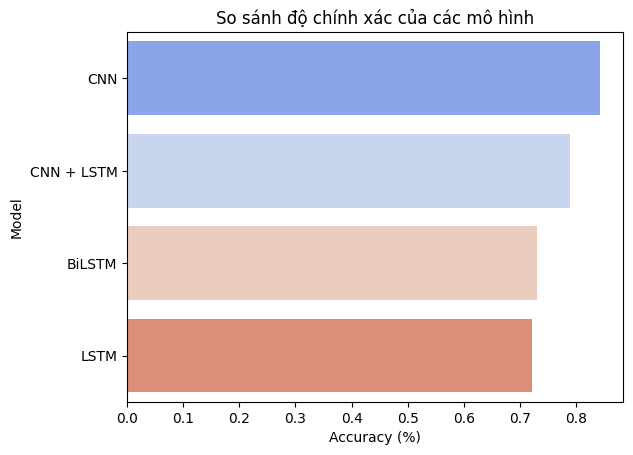


🔹 Bảng Xếp Hạng Top Models:
     Model  Train Accuracy  Train Loss  Test Accuracy  Test Loss
       CNN        0.844453    0.515629       0.841875   0.619802
CNN + LSTM        0.848828    0.480942       0.789375   0.809470
    BiLSTM        0.794453    0.652248       0.730000   0.902988
      LSTM        0.786797    0.712155       0.721250   1.113486


/tmp/ipykernel_3778/1772541585.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")


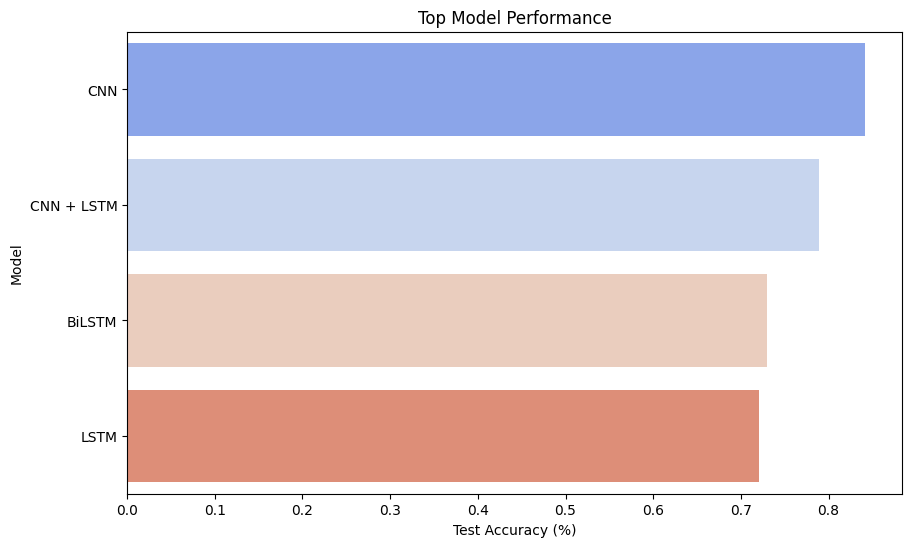


🟢 Đang dự đoán với mô hình: CNN
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step

🟢 Đang dự đoán với mô hình: LSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

🟢 Đang dự đoán với mô hình: CNN + LSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

🟢 Đang dự đoán với mô hình: BiLSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

🔹 Bảng Tổng Hợp Accuracy:
     Model  Correct Predictions  Incorrect Predictions  Accuracy (%)
       CNN                  844                    156          84.4
      LSTM                  708                    292          70.8
CNN + LSTM                  763                    237          76.3
    BiLSTM                  752                    248          75.2

🔹 Bảng Chi Tiết Dự Đoán - CNN:
                                        File       True Label  Predicted Label Correct
 ESC-50-augmented-data/1-17970-A-4_aug_1.wav         clapping         clapping       ✅
       ESC-50-master/audio/3-197435-B-22.wav       clock_tick       clock_tick       ✅
 ESC-50-augmented-data/1-31836-A

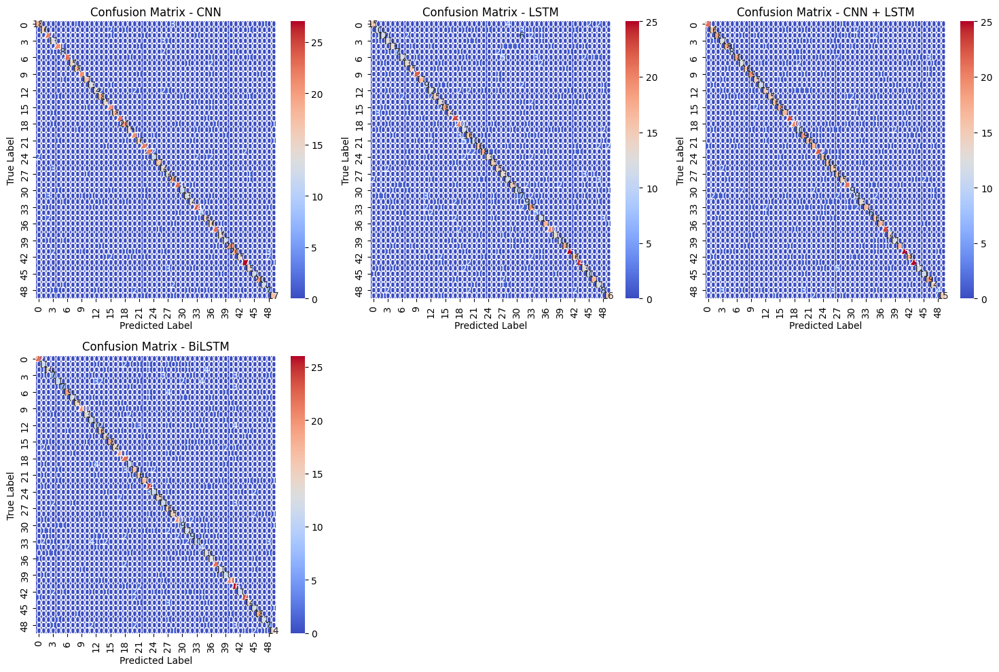

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 

🔹 Classification Report - CNN:
                  precision    recall  f1-score   support

        airplane       0.90      0.78      0.84        23
       breathing       1.00      0.80      0.89        20
  brushing_teeth       0.76      0.88      0.81        25
     can_opening       0.59      0.76      0.67        17
        car_horn       0.84      0.91      0.88        23
             cat       0.62      0.67      0.64        12
        chainsaw       1.00      0.88      0.94        26
  chirping_birds       1.00      0.83      0.91        18
    church_bells       0.90      1.00      0.95        18
        clapping       0.91      0.88      0.89        24
     clock_alarm       0.89      0.94      0.92        18
      clock_tick       0.87      0.93      0.90        14
        coughing       0.93      0.64      0.76        22
             cow       0.82      0.86      0.84        21
  crackling_fire       0.88      0.88      0.88        17

In [35]:
# ✅ Huấn luyện mô hình
models_dict = {
    "CNN": build_cnn((X_train.shape[1],), num_classes),
    "LSTM": build_lstm((X_train.shape[1],), num_classes),
    "CNN + LSTM": build_cnn_lstm((X_train.shape[1],), num_classes),
    
    "BiLSTM": build_bilstm((X_train.shape[1],), num_classes)
}

results = []
for name, model in models_dict.items():
   print(f"\n🔵 Training {name}...")
   history =model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)
   train_acc = history.history['accuracy'][-1]  # Get the last epoch's training accuracy
   train_loss = history.history['loss'][-1]      # Get the last epoch's training loss
   test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
   results.append({
           "Model": name,
           "Train Accuracy": train_acc,
           "Train Loss": train_loss,
           "Test Accuracy": test_acc,
           "Test Loss": test_loss
       })
    
# ✅ Bảng tổng hợp kết quả
df_results = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)
df_results_styled = df_results.style.background_gradient(cmap="coolwarm")
print(df_results_styled)
sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")
plt.xlabel("Accuracy (%)")
plt.ylabel("Model")
plt.title("So sánh độ chính xác của các mô hình")
plt.show()

# ✅ Sắp xếp top model theo độ chính xác
df_summary = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)

# ✅ Hiển thị bảng xếp hạng top model
print("\n🔹 Bảng Xếp Hạng Top Models:")
print(df_summary.to_string(index=False))
# ✅ Vẽ biểu đồ Top Models
plt.figure(figsize=(10, 6))
sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")
plt.xlabel("Test Accuracy (%)")
plt.ylabel("Model")
plt.title("Top Model Performance")
plt.show()

# ✅ Lấy 1000 mẫu ngẫu nhiên từ tập test gốc
random_indices = np.random.choice(len(X_test), 1000, replace=False)
# ✅ Dự đoán nhãn cho từng mô hình
model_results = []
summary_stats = []
for name, model in models_dict.items():
   print(f"\n🟢 Đang dự đoán với mô hình: {name}")
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   # ✅ Chuyển nhãn về dạng tên thực tế
   true_labels = encoder.inverse_transform(y_true)
   predicted_labels = encoder.inverse_transform(y_pred)
   # ✅ Tổng hợp kết quả dự đoán
   results = []
   for i in range(len(random_indices)):
       results.append({
           "Model": name,
           "File": dataset.iloc[random_indices[i]]["files_path"],
           "True Label": true_labels[i],
           "Predicted Label": predicted_labels[i],
           "Correct": "✅" if true_labels[i] == predicted_labels[i] else "❌"
       })
   df_results = pd.DataFrame(results)
   # ✅ Tính toán số dự đoán đúng/sai
   correct_predictions = sum(y_true == y_pred)
   incorrect_predictions = len(y_true) - correct_predictions
   accuracy = round((correct_predictions / len(y_true)) * 100, 2)
   # ✅ Xuất bảng tổng hợp
   summary_stats.append({
       "Model": name,
       "Correct Predictions": correct_predictions,
       "Incorrect Predictions": incorrect_predictions,
       "Accuracy (%)": accuracy
   })
   # ✅ Lưu kết quả dự đoán của từng mô hình
   model_results.append(df_results)
# ✅ Hiển thị bảng tổng hợp kết quả Accuracy
df_summary = pd.DataFrame(summary_stats)
print("\n🔹 Bảng Tổng Hợp Accuracy:")
print(df_summary.to_string(index=False))
# ✅ Hiển thị bảng chi tiết kết quả dự đoán của từng mô hình
for df in model_results:
   model_name = df["Model"][0]
   print(f"\n🔹 Bảng Chi Tiết Dự Đoán - {model_name}:")
   print(df[['File', 'True Label', 'Predicted Label', 'Correct']].head(10).to_string(index=False))  # Hiển thị 10 dòng đầu tiên
# ✅ Hiển thị ma trận nhầm lẫn cho từng mô hình
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dict.items()):
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   plt.subplot(2, 3, i + 1)  # Điều chỉnh để phù hợp với số mô hình
   sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt="d", cmap="coolwarm")
   plt.xlabel("Predicted Label")
   plt.ylabel("True Label")
   plt.title(f"Confusion Matrix - {name}")
plt.tight_layout()
plt.show()
# ✅ Xuất báo cáo phân loại cho từng mô hình
for name, model in models_dict.items():
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   print(f"\n🔹 Classification Report - {name}:")
   print(classification_report(y_true, y_pred, labels=np.unique(y_true), target_names=encoder.inverse_transform(np.unique(y_true))))

In [36]:
#✅ Trích xuất them  đặc trưng âm thanh
# ✅ Trích xuất đặc trưng âm thanh
features = [
    'zero_crossing_rate', 'chroma_stft', 'rmse', 'spectral_centroid', 'spectral_bandwidth',
    'beat_per_minute', 'rolloff', 'spectral_contrast', 'tonnetz', 'spectral_flatness',
    'mel_spectrogram', 'chroma_cens'
] + [f'mfcc_{i}' for i in range(20)]

for feature in features:
    dataset[feature] = np.zeros(len(dataset))

print("\n🟢 Bắt đầu trích xuất đặc trưng...")
for i in tqdm(range(len(dataset))):
    file_path = dataset['files_path'][i]
    if os.path.exists(file_path):
        y, sr = librosa.load(file_path, mono=True)
        dataset.at[i, 'rmse'] = np.mean(librosa.feature.rms(y=y))
        dataset.at[i, 'chroma_stft'] = np.mean(librosa.feature.chroma_stft(y=y, sr=sr))
        dataset.at[i, 'spectral_centroid'] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
        dataset.at[i, 'spectral_bandwidth'] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
        dataset.at[i, 'rolloff'] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
        dataset.at[i, 'zero_crossing_rate'] = np.mean(librosa.feature.zero_crossing_rate(y))
        dataset.at[i, 'spectral_contrast'] = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr))
        dataset.at[i, 'tonnetz'] = np.mean(librosa.feature.tonnetz(y=y, sr=sr))
        dataset.at[i, 'spectral_flatness'] = np.mean(librosa.feature.spectral_flatness(y=y))
        dataset.at[i, 'mel_spectrogram'] = np.mean(librosa.feature.melspectrogram(y=y, sr=sr))
        dataset.at[i, 'chroma_cens'] = np.mean(librosa.feature.chroma_cens(y=y, sr=sr))
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
        dataset.at[i, 'beat_per_minute'] = tempo
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        for e in range(20):
            dataset.at[i, f'mfcc_{e}'] = np.mean(mfcc[e])

# ✅ Chuẩn hóa dữ liệu
scaler = StandardScaler()
X = dataset[features]
X_scaled = scaler.fit_transform(X)

# Cập nhật dataset với dữ liệu đã chuẩn hóa
for i, feature in enumerate(features):
    dataset[feature] = X_scaled[:, i]

# ✅ Chia tập dữ liệu train/test
train = dataset.sample(frac=0.8, random_state=SEED)
test = dataset.drop(train.index)
X_train = train[features]
X_test = test[features]
y_train = train['target']
y_test = test['target']


🟢 Bắt đầu trích xuất đặc trưng...


  1%|▎                                    | 109/16000 [00:41<1:40:51,  2.63it/s]/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/librosa/core/pitch.py:101: UserWarning: Trying to estimate tuning from empty frequency set.
  return pitch_tuning(
100%|███████████████████████████████████| 16000/16000 [1:39:51<00:00,  2.67it/s]


/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



🔵 Training CNN...
Epoch 1/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.0768 - loss: 4.4921 - val_accuracy: 0.2525 - val_loss: 3.0031
Epoch 2/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.2703 - loss: 2.9264 - val_accuracy: 0.5581 - val_loss: 1.7611
Epoch 3/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.3838 - loss: 2.3788 - val_accuracy: 0.6253 - val_loss: 1.4489
Epoch 4/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4594 - loss: 1.9939 - val_accuracy: 0.6859 - val_loss: 1.2213
Epoch 5/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5457 - loss: 1.6997 - val_accuracy: 0.7216 - val_loss: 1.0725
Epoch 6/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.5923 - loss: 1.4832 - val_accuracy: 0.7509 - val_loss: 0.9611
Epoch 7/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6407 - loss: 1.2973 - val_accuracy: 0.7638 - val_loss: 0.8676
Epoch 8/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.6886 - los

/tmp/ipykernel_3778/1729479294.py:109: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")


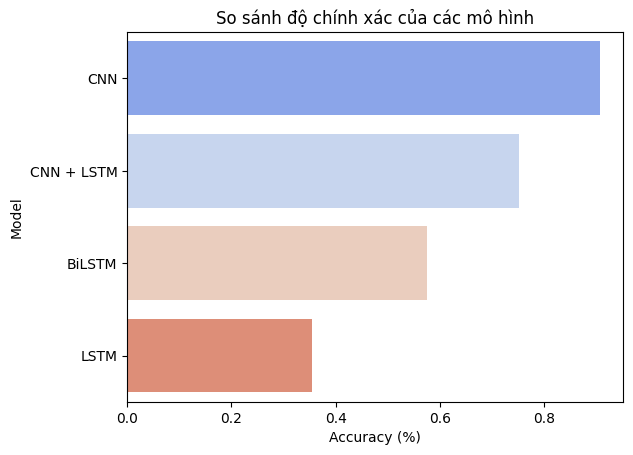


🔹 Bảng Xếp Hạng Top Models:
     Model  Train Accuracy  Train Loss  Test Accuracy  Test Loss
       CNN        0.985859    0.045656       0.906250   0.449537
CNN + LSTM        0.872031    0.427323       0.752187   1.015649
    BiLSTM        0.577422    1.473191       0.574687   1.512123
      LSTM        0.356172    2.375753       0.354375   2.380730


/tmp/ipykernel_3778/1729479294.py:123: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")


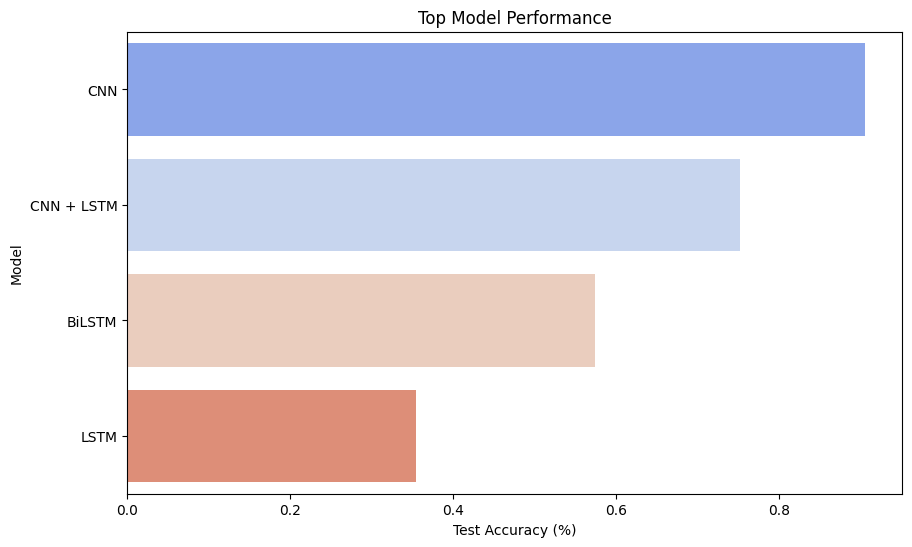


🟢 Đang dự đoán với mô hình: CNN
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step

🟢 Đang dự đoán với mô hình: LSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

🟢 Đang dự đoán với mô hình: CNN + LSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step

🟢 Đang dự đoán với mô hình: BiLSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 35ms/step

🔹 Bảng Tổng Hợp Accuracy:
     Model  Correct Predictions  Incorrect Predictions  Accuracy (%)
       CNN                  899                    101          89.9
      LSTM                  344                    656          34.4
CNN + LSTM                  768                    232          76.8
    BiLSTM                  578                    422          57.8

🔹 Bảng Chi Tiết Dự Đoán - CNN:
                                         File       True Label  Predicted Label Correct
        ESC-50-master/audio/3-185456-A-29.wav       clock_tick       clock_tick       ✅
 ESC-50-augmented-data/1-23094-B-15_aug_0.wav          insects          insects       ✅
  ESC-50-augmented-data/1-180

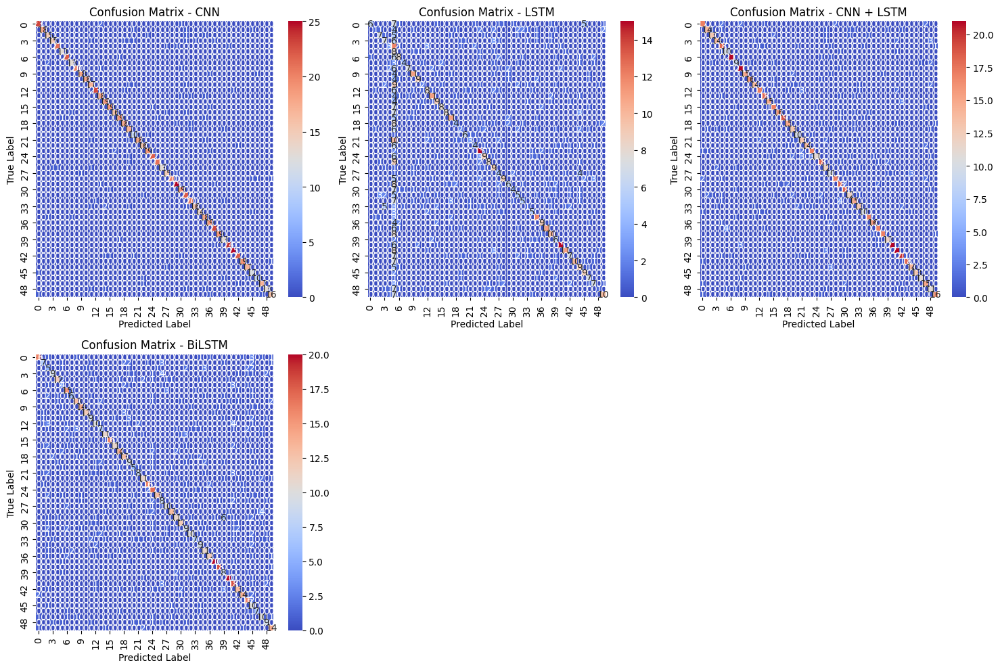

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step

🔹 Classification Report - CNN:
                  precision    recall  f1-score   support

        airplane       0.92      0.88      0.90        26
       breathing       1.00      0.86      0.92        21
  brushing_teeth       0.83      0.83      0.83        18
     can_opening       0.94      0.68      0.79        22
        car_horn       0.95      0.88      0.91        24
             cat       0.93      1.00      0.96        13
        chainsaw       1.00      0.96      0.98        23
  chirping_birds       0.87      0.87      0.87        15
    church_bells       1.00      0.91      0.95        22
        clapping       0.95      0.90      0.92        20
     clock_alarm       1.00      1.00      1.00        18
      clock_tick       0.77      0.85      0.81        20
        coughing       0.96      0.92      0.94        25
             cow       0.82      0.86      0.84        21
  crackling_fire       0.83      1.00      0.90        19


In [37]:
""" 4 mo hinh cai tien"""
# ✅ Xây dựng các mô hình
def build_cnn(input_shape, num_classes):
    model = models.Sequential([
        layers.Reshape((input_shape[0], 1), input_shape=input_shape),
        layers.Conv1D(128, kernel_size=3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling1D(pool_size=2),
        layers.Conv1D(256, kernel_size=3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling1D(pool_size=2),
        layers.Conv1D(512, kernel_size=3, activation="relu", padding="same"),
        layers.BatchNormalization(),
        layers.MaxPooling1D(pool_size=2),
        layers.Flatten(),
        layers.Dense(512, activation="relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation="relu"),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(num_classes, activation="softmax")
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model

def build_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.LSTM(256, return_sequences=True, dropout=0.3)(x)
    x = layers.LSTM(128, return_sequences=True, dropout=0.3)(x)
    x = layers.LSTM(64, return_sequences=False, dropout=0.3)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model

def build_cnn_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Conv1D(128, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.Conv1D(256, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.Conv1D(512, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.LSTM(256, return_sequences=True, dropout=0.3)(x)
    x = layers.LSTM(128, return_sequences=True, dropout=0.3)(x)
    x = layers.LSTM(64, return_sequences=False, dropout=0.3)(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model

def build_bilstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Bidirectional(layers.LSTM(256, return_sequences=True, dropout=0.3))(x)
    x = layers.Bidirectional(layers.LSTM(128, return_sequences=True, dropout=0.3))(x)
    x = layers.Bidirectional(layers.LSTM(64, return_sequences=False, dropout=0.3))(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)
    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model

# ✅ Huấn luyện các mô hình
# ✅ Huấn luyện mô hình
models_dict = {
    "CNN": build_cnn((X_train.shape[1],), num_classes),
    "LSTM": build_lstm((X_train.shape[1],), num_classes),
    "CNN + LSTM": build_cnn_lstm((X_train.shape[1],), num_classes),
    
    "BiLSTM": build_bilstm((X_train.shape[1],), num_classes)
}

results = []
for name, model in models_dict.items():
   print(f"\n🔵 Training {name}...")
   history =model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)
   train_acc = history.history['accuracy'][-1]  # Get the last epoch's training accuracy
   train_loss = history.history['loss'][-1]      # Get the last epoch's training loss
   test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
   results.append({
           "Model": name,
           "Train Accuracy": train_acc,
           "Train Loss": train_loss,
           "Test Accuracy": test_acc,
           "Test Loss": test_loss
       })
    
# ✅ Bảng tổng hợp kết quả
df_results = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)
df_results_styled = df_results.style.background_gradient(cmap="coolwarm")
print(df_results_styled)
sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")
plt.xlabel("Accuracy (%)")
plt.ylabel("Model")
plt.title("So sánh độ chính xác của các mô hình")
plt.show()

# ✅ Sắp xếp top model theo độ chính xác
df_summary = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)

# ✅ Hiển thị bảng xếp hạng top model
print("\n🔹 Bảng Xếp Hạng Top Models:")
print(df_summary.to_string(index=False))
# ✅ Vẽ biểu đồ Top Models
plt.figure(figsize=(10, 6))
sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")
plt.xlabel("Test Accuracy (%)")
plt.ylabel("Model")
plt.title("Top Model Performance")
plt.show()

# ✅ Lấy 1000 mẫu ngẫu nhiên từ tập test gốc
random_indices = np.random.choice(len(X_test), 1000, replace=False)
# ✅ Dự đoán nhãn cho từng mô hình
model_results = []
summary_stats = []
for name, model in models_dict.items():
   print(f"\n🟢 Đang dự đoán với mô hình: {name}")
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   # ✅ Chuyển nhãn về dạng tên thực tế
   true_labels = encoder.inverse_transform(y_true)
   predicted_labels = encoder.inverse_transform(y_pred)
   # ✅ Tổng hợp kết quả dự đoán
   results = []
   for i in range(len(random_indices)):
       results.append({
           "Model": name,
           "File": dataset.iloc[random_indices[i]]["files_path"],
           "True Label": true_labels[i],
           "Predicted Label": predicted_labels[i],
           "Correct": "✅" if true_labels[i] == predicted_labels[i] else "❌"
       })
   df_results = pd.DataFrame(results)
   # ✅ Tính toán số dự đoán đúng/sai
   correct_predictions = sum(y_true == y_pred)
   incorrect_predictions = len(y_true) - correct_predictions
   accuracy = round((correct_predictions / len(y_true)) * 100, 2)
   # ✅ Xuất bảng tổng hợp
   summary_stats.append({
       "Model": name,
       "Correct Predictions": correct_predictions,
       "Incorrect Predictions": incorrect_predictions,
       "Accuracy (%)": accuracy
   })
   # ✅ Lưu kết quả dự đoán của từng mô hình
   model_results.append(df_results)
# ✅ Hiển thị bảng tổng hợp kết quả Accuracy
df_summary = pd.DataFrame(summary_stats)
print("\n🔹 Bảng Tổng Hợp Accuracy:")
print(df_summary.to_string(index=False))
# ✅ Hiển thị bảng chi tiết kết quả dự đoán của từng mô hình
for df in model_results:
   model_name = df["Model"][0]
   print(f"\n🔹 Bảng Chi Tiết Dự Đoán - {model_name}:")
   print(df[['File', 'True Label', 'Predicted Label', 'Correct']].head(10).to_string(index=False))  # Hiển thị 10 dòng đầu tiên
# ✅ Hiển thị ma trận nhầm lẫn cho từng mô hình
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dict.items()):
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   plt.subplot(2, 3, i + 1)  # Điều chỉnh để phù hợp với số mô hình
   sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt="d", cmap="coolwarm")
   plt.xlabel("Predicted Label")
   plt.ylabel("True Label")
   plt.title(f"Confusion Matrix - {name}")
plt.tight_layout()
plt.show()
# ✅ Xuất báo cáo phân loại cho từng mô hình
for name, model in models_dict.items():
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   print(f"\n🔹 Classification Report - {name}:")
   print(classification_report(y_true, y_pred, labels=np.unique(y_true), target_names=encoder.inverse_transform(np.unique(y_true))))

# **===================================== END HERE ==================================**

/home/phuong/pythonenv/my_env/lib/python3.12/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)



🔵 Training CNN...
Epoch 1/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.1368 - loss: 3.4201 - val_accuracy: 0.4688 - val_loss: 2.0330
Epoch 2/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.3874 - loss: 2.1986 - val_accuracy: 0.5722 - val_loss: 1.4598
Epoch 3/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4883 - loss: 1.7862 - val_accuracy: 0.6628 - val_loss: 1.1620
Epoch 4/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5597 - loss: 1.5132 - val_accuracy: 0.6872 - val_loss: 1.0294
Epoch 5/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6061 - loss: 1.3327 - val_accuracy: 0.7331 - val_loss: 0.8991
Epoch 6/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6496 - loss: 1.1794 - val_accuracy: 0.7422 - val_loss: 0.8563
Epoch 7/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6806 - loss: 1.0687 - val_accuracy: 0.7606 - val_loss: 0.7969
Epoch 8/100
400/400 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6989 - loss

/tmp/ipykernel_3778/3078675565.py:137: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")


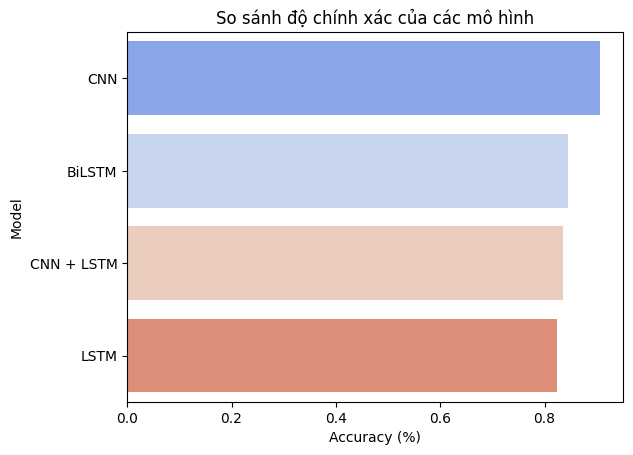


🔹 Bảng Xếp Hạng Top Models:
     Model  Train Accuracy  Train Loss  Test Accuracy  Test Loss
       CNN        0.943203    0.196490       0.905312   0.488641
    BiLSTM        0.930078    0.234271       0.845000   0.715564
CNN + LSTM        0.932109    0.214887       0.835000   0.830462
      LSTM        0.945312    0.191228       0.823438   1.087478


/tmp/ipykernel_3778/3078675565.py:151: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")


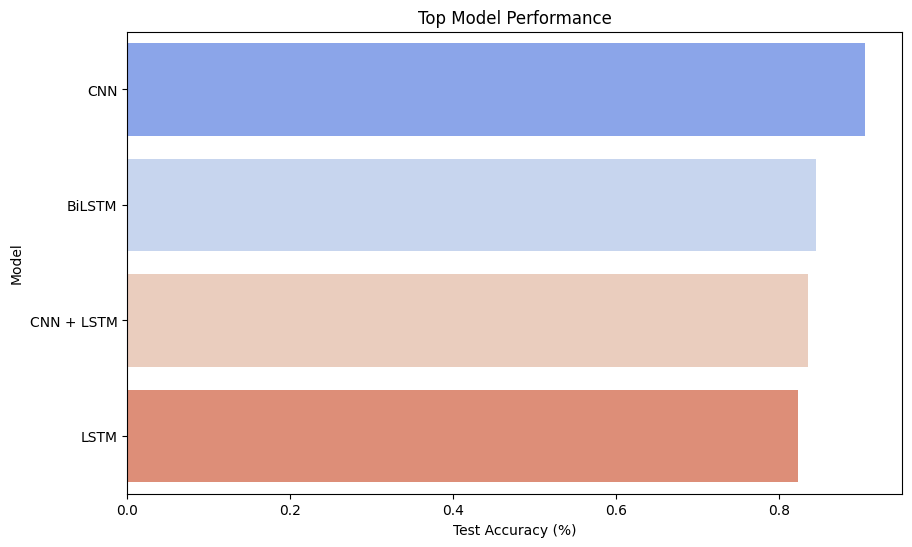


🟢 Đang dự đoán với mô hình: CNN
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step

🟢 Đang dự đoán với mô hình: CNN + LSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step

🟢 Đang dự đoán với mô hình: LSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step

🟢 Đang dự đoán với mô hình: BiLSTM
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step

🔹 Bảng Tổng Hợp Accuracy:
     Model  Correct Predictions  Incorrect Predictions  Accuracy (%)
       CNN                  915                     85          91.5
CNN + LSTM                  819                    181          81.9
      LSTM                  830                    170          83.0
    BiLSTM                  848                    152          84.8

🔹 Bảng Chi Tiết Dự Đoán - CNN:
                                        File      True Label Predicted Label Correct
       ESC-50-master/audio/4-111671-B-42.wav  crackling_fire  crackling_fire       ✅
       ESC-50-master/audio/2-104105-B-19.wav       fireworks       fireworks       ✅
ESC-50-augmented-data/1-17808-A-12_aug

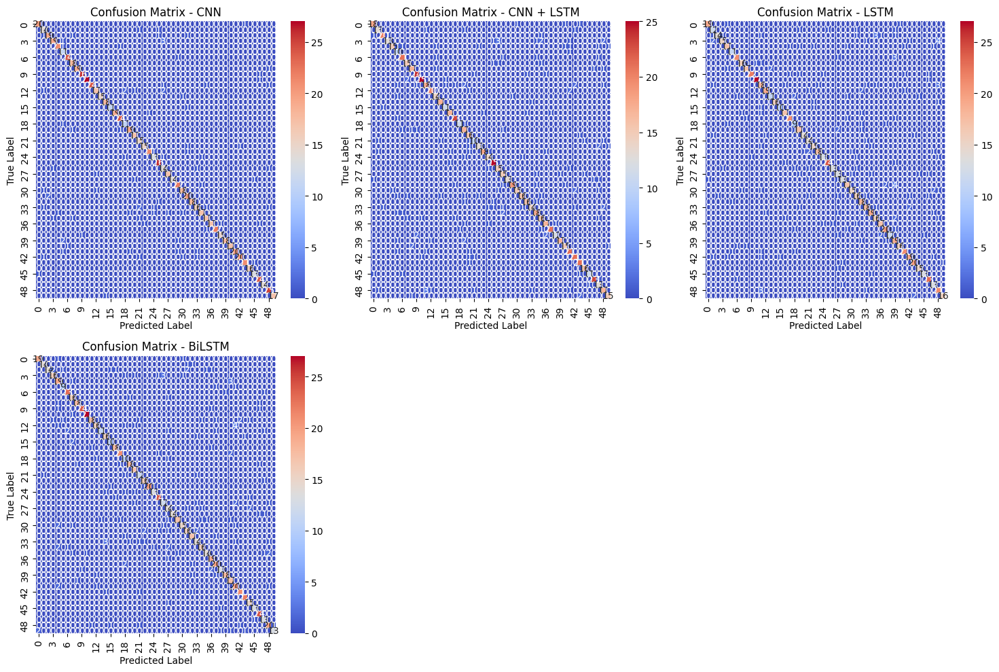

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

🔹 Classification Report - CNN:
                  precision    recall  f1-score   support

        airplane       0.95      0.95      0.95        21
       breathing       0.74      0.88      0.80        16
  brushing_teeth       0.90      0.83      0.86        23
     can_opening       0.90      0.83      0.86        23
        car_horn       0.95      0.91      0.93        23
             cat       0.65      1.00      0.79        11
        chainsaw       0.96      0.96      0.96        25
  chirping_birds       0.86      1.00      0.92        18
    church_bells       1.00      0.95      0.97        20
        clapping       0.96      0.96      0.96        27
     clock_alarm       1.00      0.96      0.98        28
      clock_tick       1.00      0.89      0.94        27
        coughing       0.89      0.74      0.81        23
             cow       1.00      0.94      0.97        16
  crackling_fire       0.95      1.00      0.97        18


In [38]:
# ✅ cai tien them mo hinh 1 lan nua 
# ✅ Xây dựng mô hình CNN
def build_cnn_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)

    # ✅ Tầng CNN để trích xuất đặc trưng không gian
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Conv1D(64, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.Conv1D(128, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    x = layers.Conv1D(256, kernel_size=3, activation="relu", padding="same")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)

    # ✅ LSTM để học thông tin chuỗi
    x = layers.LSTM(128, return_sequences=True, dropout=0.3)(x)
    x = layers.LSTM(64, return_sequences=False, dropout=0.3)(x)

    # ✅ Fully Connected
    x = layers.BatchNormalization()(x)
    x = layers.Dense(128, activation="relu")(x)
    x = layers.Dropout(0.4)(x)

    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003), 
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    
    return model

def build_bilstm(input_shape, num_classes):
   inputs = layers.Input(shape=input_shape)
   # ✅ Tầng CNN để trích xuất đặc trưng không gian
   x = layers.Reshape((input_shape[0], 1))(inputs)
   x = layers.Conv1D(256, kernel_size=5, padding="same", activation="relu")(x)
   x = layers.MaxPooling1D(pool_size=2)(x)
   x = layers.Conv1D(128, kernel_size=3, padding="same", activation="relu")(x)
   x = layers.MaxPooling1D(pool_size=2)(x)
   # ✅ BiLSTM để học thông tin ngữ cảnh
   x = layers.Bidirectional(layers.LSTM(256, return_sequences=True, dropout=0.3))(x)
   x = layers.Bidirectional(layers.LSTM(128, return_sequences=True, dropout=0.3))(x)
   x = layers.Bidirectional(layers.LSTM(64, return_sequences=False, dropout=0.3))(x)
   # ✅ Thêm BatchNormalization để ổn định huấn luyện
   x = layers.BatchNormalization()(x)
   x = layers.Dense(128, activation="relu")(x)
   x = layers.Dropout(0.4)(x)
   outputs = layers.Dense(num_classes, activation="softmax")(x)
   model = models.Model(inputs, outputs)
   model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0003), 
                 loss="sparse_categorical_crossentropy",
                 metrics=["accuracy"])
   return model

def build_cnn(input_shape, num_classes):
    model = models.Sequential([
        layers.Dense(512, activation="relu", input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Dense(256, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(128, activation="relu"),
        layers.Dense(64, activation="relu"),
        layers.Dropout(0.3),
        layers.Dense(num_classes, activation="softmax")
    ])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                  loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model

def attention_layer(inputs):
    """
    Cơ chế Attention giúp mô hình tập trung vào đặc trưng quan trọng.
    """
    attention_weights = layers.Dense(1, activation="tanh")(inputs)
    attention_weights = layers.Flatten()(attention_weights)
    attention_weights = layers.Activation("softmax")(attention_weights)
    attention_weights = layers.RepeatVector(inputs.shape[-1])(attention_weights)
    attention_weights = layers.Permute([2, 1])(attention_weights)
    
    return layers.Multiply()([inputs, attention_weights])

def build_lstm(input_shape, num_classes):
    inputs = layers.Input(shape=input_shape)
    
    # ✅ Thêm CNN để trích xuất đặc trưng trước khi đưa vào LSTM
    x = layers.Reshape((input_shape[0], 1))(inputs)
    x = layers.Conv1D(128, kernel_size=3, padding="same", activation="relu")(x)
    x = layers.MaxPooling1D(pool_size=2)(x)
    
    # ✅ Bi-directional LSTM để tận dụng ngữ cảnh hai chiều
    x = layers.Bidirectional(layers.LSTM(128, return_sequences=True))(x)
    x = layers.Bidirectional(layers.LSTM(64, return_sequences=True))(x)

    # ✅ Thêm Attention
    x = attention_layer(x)

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(64, activation="relu")(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(num_classes, activation="softmax")(x)

    model = models.Model(inputs, outputs)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),  # Giảm learning rate
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
    return model


# ✅ Huấn luyện mô hình
models_dict = {
    "CNN": build_cnn((X_train.shape[1],), num_classes),
    "CNN + LSTM": build_cnn_lstm((X_train.shape[1],), num_classes),
    "LSTM": build_lstm((X_train.shape[1],), num_classes),
    "BiLSTM": build_bilstm((X_train.shape[1],), num_classes)
}

results = []
for name, model in models_dict.items():
   print(f"\n🔵 Training {name}...")
   history =model.fit(X_train, y_train, epochs=100, batch_size=32, validation_data=(X_test, y_test), verbose=1)
   train_acc = history.history['accuracy'][-1]  # Get the last epoch's training accuracy
   train_loss = history.history['loss'][-1]      # Get the last epoch's training loss
   test_loss, test_acc = model.evaluate(X_test, y_test, verbose=0)
   results.append({
           "Model": name,
           "Train Accuracy": train_acc,
           "Train Loss": train_loss,
           "Test Accuracy": test_acc,
           "Test Loss": test_loss
       })
    
# ✅ Bảng tổng hợp kết quả
df_results = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)
df_results_styled = df_results.style.background_gradient(cmap="coolwarm")
print(df_results_styled)
sns.barplot(x="Test Accuracy", y="Model", data=df_results, palette="coolwarm")
plt.xlabel("Accuracy (%)")
plt.ylabel("Model")
plt.title("So sánh độ chính xác của các mô hình")
plt.show()

# ✅ Sắp xếp top model theo độ chính xác
df_summary = pd.DataFrame(results).sort_values(by="Test Accuracy", ascending=False)

# ✅ Hiển thị bảng xếp hạng top model
print("\n🔹 Bảng Xếp Hạng Top Models:")
print(df_summary.to_string(index=False))
# ✅ Vẽ biểu đồ Top Models
plt.figure(figsize=(10, 6))
sns.barplot(x="Test Accuracy", y="Model", data=df_summary, palette="coolwarm")
plt.xlabel("Test Accuracy (%)")
plt.ylabel("Model")
plt.title("Top Model Performance")
plt.show()

# ✅ Lấy 1000 mẫu ngẫu nhiên từ tập test gốc
random_indices = np.random.choice(len(X_test), 1000, replace=False)
# ✅ Dự đoán nhãn cho từng mô hình
model_results = []
summary_stats = []
for name, model in models_dict.items():
   print(f"\n🟢 Đang dự đoán với mô hình: {name}")
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   # ✅ Chuyển nhãn về dạng tên thực tế
   true_labels = encoder.inverse_transform(y_true)
   predicted_labels = encoder.inverse_transform(y_pred)
   # ✅ Tổng hợp kết quả dự đoán
   results = []
   for i in range(len(random_indices)):
       results.append({
           "Model": name,
           "File": dataset.iloc[random_indices[i]]["files_path"],
           "True Label": true_labels[i],
           "Predicted Label": predicted_labels[i],
           "Correct": "✅" if true_labels[i] == predicted_labels[i] else "❌"
       })
   df_results = pd.DataFrame(results)
   # ✅ Tính toán số dự đoán đúng/sai
   correct_predictions = sum(y_true == y_pred)
   incorrect_predictions = len(y_true) - correct_predictions
   accuracy = round((correct_predictions / len(y_true)) * 100, 2)
   # ✅ Xuất bảng tổng hợp
   summary_stats.append({
       "Model": name,
       "Correct Predictions": correct_predictions,
       "Incorrect Predictions": incorrect_predictions,
       "Accuracy (%)": accuracy
   })
   # ✅ Lưu kết quả dự đoán của từng mô hình
   model_results.append(df_results)
# ✅ Hiển thị bảng tổng hợp kết quả Accuracy
df_summary = pd.DataFrame(summary_stats)
print("\n🔹 Bảng Tổng Hợp Accuracy:")
print(df_summary.to_string(index=False))
# ✅ Hiển thị bảng chi tiết kết quả dự đoán của từng mô hình
for df in model_results:
   model_name = df["Model"][0]
   print(f"\n🔹 Bảng Chi Tiết Dự Đoán - {model_name}:")
   print(df[['File', 'True Label', 'Predicted Label', 'Correct']].head(10).to_string(index=False))  # Hiển thị 10 dòng đầu tiên
# ✅ Hiển thị ma trận nhầm lẫn cho từng mô hình
plt.figure(figsize=(15, 10))
for i, (name, model) in enumerate(models_dict.items()):
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   plt.subplot(2, 3, i + 1)  # Điều chỉnh để phù hợp với số mô hình
   sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt="d", cmap="coolwarm")
   plt.xlabel("Predicted Label")
   plt.ylabel("True Label")
   plt.title(f"Confusion Matrix - {name}")
plt.tight_layout()
plt.show()
# ✅ Xuất báo cáo phân loại cho từng mô hình
for name, model in models_dict.items():
   y_pred = np.argmax(model.predict(X_test.iloc[random_indices]), axis=1)
   y_true = y_test.iloc[random_indices].values
   print(f"\n🔹 Classification Report - {name}:")
   print(classification_report(y_true, y_pred, labels=np.unique(y_true), target_names=encoder.inverse_transform(np.unique(y_true))))